<div class="alert alert-block alert-danger">
<H1>
IBM MACHINE LEARNING CERTIFICATION: SUPERVISED MACHINE LEARNING REGRESSION MODELS
</H1></div>

<span style='color:Indigo'>**Course Link: https://www.coursera.org/learn/supervised-machine-learning-regression**</span>

<div class="alert alert-block alert-info">
<H2>
BEST REGRESSION MODEL FOR AMES, IOWA HOUSE PRICE PREDICTION
</H2></div>

<div class="alert alert-block alert-success">
<H3>
Fatima, Sayeda
</H3></div>

<div class="alert alert-block alert-warning">
<H4>    
<span style='color:Indigo'> Outline Editable Variables </span>
</H4></div>

In [1]:
output_file_path = "C:/Users/fatima.s/Downloads/Ames Housing Price Prediction.xlsx"
save_plot = "Features.png" # "C:/Users/fatima.s/Downloads/Features.png"
delete_features = ['Roof Matl', 'Alley'] # List Specific Features you want to retain for automated drops

<div class="alert alert-block alert-warning">
<H4>    
<span style='color:Indigo'> Import Libraries </span>
</H4></div>

In [2]:
import warnings
import numpy as np
import pandas as pd
import sweetviz as sv # For Automated Exploratory Data Analysis

from collinearity import SelectNonCollinear 

from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.pipeline import make_pipeline # To Make Model Pipelines
from sklearn.preprocessing import RobustScaler, LabelEncoder, StandardScaler#, cross_val_score
import matplotlib.pyplot as plt
import seaborn as sns # For Correlation Matrix
import scipy.stats as st # For Normalizing Skewness

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from scipy.stats import loguniform, norm # probplot, boxcox



from termcolor import colored     # To Display Colored Terminal Output

from datetime import date
from datetime import datetime

<div class="alert alert-block alert-danger">
<H4>
Get Script Start Time
</H4></div>

In [3]:
script_start_time = datetime.now()
print(script_start_time)

2022-09-24 07:03:57.004706


<div class="alert alert-block alert-warning">
<H4>
Ignore Warnings & Random Seed Provision
</H4></div>

In [4]:
warnings.filterwarnings('ignore') # import warnings
rs = 123

<div class="alert alert-block alert-success">
<H4>
About the Dataset
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
1a) Brief description of the data set you chose: <br>
This project uses dataset for 'Ames Housing' which may also be downloaded from the following link:
    https://www.kaggle.com/datasets/prevek18/ames-housing-dataset <br>
This dataset represents housing data for Ames, Iowa region in between 2006 to 2010.
    </H4></div>

<div class="alert alert-block alert-warning">
<H4>
1b) Summary of Data Attributes: <br>
    The dataset exhibits 2930 data points (rows) and the following 82 features (columns): <br> 


In [5]:
raw_data = pd.read_csv('C:/Users/fatima.s/Documents/PythonScripts/DATA SCIENCE/IBM Machine Learning Intermediate/MODULE 2 SUPERVISED MACHINE LEARNING REGRESSION/DATASETS/AmesHousing.csv')
raw_data

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926,923275080,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,2927,923276100,20,RL,NaN,8885,Pave,NaN,IR1,Low,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,2928,923400125,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,2929,924100070,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


In [6]:
#raw_data.info()

In [7]:
df = raw_data.copy()

In [8]:
target = 'SalePrice'
predicted_var = 'Predicted Price'

<div class="alert alert-block alert-success">
<H4>
Initial Exploratory Data Analysis
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
Method to Generate Preliminary Exploratory Data Analysis
</H4></div>

In [9]:
def analysis(*name): # This Method will extract dataframe by name 
    n = name # Extract Dataframe by Name...this will create a 3d tuple
    n = (n[0]) # Convert Tuple to To Dataframe
    df_name = [x for x in globals() if globals()[x] is n][0] # Extract Name of Imported Dataframe to print later
    
    # Perform Statistics
    stats = n.describe(include = 'all').transpose()
    stats = stats.fillna(0) # Replace all Nan Values with Zero
    
    # Data Analysis
    obs = n.shape[0]
    types = n.dtypes
    counts = n.apply(lambda x: x.count())   
    distincts = n.apply(lambda x: x.unique().shape[0])
    nulls = n.apply(lambda x: x.isnull().sum())
    uniques = n.apply(lambda x: [x.unique()])
    per_nulls = (n.isnull().sum()/ obs) * 100
    skewness = n.skew()
    kurtosis = n.kurt() 
    corr = n.corrwith(n[target])# "SalePrice"
    #corr = corr.to_string()
    
    # Transform Data Analysis to Dataframe
    analyze = pd.DataFrame(columns=['Columns','types', 'counts', 'distincts', 'nulls', '% nulls', 'uniques', 'skewness', 'kurtosis', 'Corr_Sales'])
    analyze['types'] = types
    analyze['counts'] = counts
    analyze['distincts'] = distincts
    analyze['nulls'] = nulls
    analyze['% nulls'] = per_nulls
    analyze['uniques'] = uniques
    analyze['skewness'] = skewness
    analyze['kurtosis'] = kurtosis
    analyze['Corr_Sales'] = corr
    analyze['Columns'] = analyze.index
    analyze = analyze.fillna(0).sort_values(by=['Corr_Sales','skewness'], ascending=False) #Fill Remaining Missing Values with Zero
    analyze = analyze.replace(["NaN"], 0).sort_values(by='Corr_Sales', ascending=False)
    analyze = analyze.reset_index(drop=True)    
        
    print(colored("\nData Analysis for: ", 'green', attrs=['bold'])
          +colored(df_name, 'red', attrs=['bold'])
          + colored("\nData Shape:", 'green', attrs=['bold'])
          +colored(obs, 'magenta', attrs=['bold'])
         )

    return analyze, stats

In [10]:
analyze, stats = analysis(raw_data)
print(colored("\nSummary Statistics\n", 'blue', attrs=['bold']))
stats


Data Analysis for: _
Data Shape:2930

Summary Statistics



,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Order,2930.0,0,0,0,1.465500e+03,8.459625e+02,1.0,7.332500e+02,1465.5,2.197750e+03,2.930000e+03
PID,2930.0,0,0,0,7.144645e+08,1.887308e+08,526301100.0,5.284770e+08,535453620.0,9.071811e+08,1.007100e+09
MS SubClass,2930.0,0,0,0,5.738737e+01,4.263802e+01,20.0,2.000000e+01,50.0,7.000000e+01,1.900000e+02
MS Zoning,2930.0,7,RL,2273,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.000000e+00
Lot Frontage,2440.0,0,0,0,6.922459e+01,2.336533e+01,21.0,5.800000e+01,68.0,8.000000e+01,3.130000e+02
...,...,...,...,...,...,...,...,...,...,...,...
Mo Sold,2930.0,0,0,0,6.216041e+00,2.714492e+00,1.0,4.000000e+00,6.0,8.000000e+00,1.200000e+01
Yr Sold,2930.0,0,0,0,2.007790e+03,1.316613e+00,2006.0,2.007000e+03,2008.0,2.009000e+03,2.010000e+03
Sale Type,2930.0,10,WD,2536,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.000000e+00
Sale Condition,2930.0,6,Normal,2413,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.0,0.000000e+00,0.000000e+00


In [11]:
print(colored("\nData Analysis Summary:", 'cyan', attrs=['bold']))
analyze


Data Analysis Summary:


,Columns,types,counts,distincts,nulls,% nulls,uniques,skewness,kurtosis,Corr_Sales
0,SalePrice,int64,2930,1032,0,0.00000,0,1.743500,5.118900,1.000000
1,Overall Qual,int64,2930,10,0,0.00000,0,0.190634,0.052412,0.799262
2,Gr Liv Area,int64,2930,1292,0,0.00000,0,1.274110,4.137838,0.706780
3,Garage Cars,float64,2929,7,1,0.03413,0,-0.219836,0.244969,0.647877
4,Garage Area,float64,2929,604,1,0.03413,0,0.241994,0.951023,0.640401
...,...,...,...,...,...,...,...,...,...,...
77,MS SubClass,int64,2930,16,0,0.00000,0,1.357579,1.386775,-0.085092
78,Overall Cond,int64,2930,9,0,0.00000,0,0.574429,1.491450,-0.101697
79,Kitchen AbvGr,int64,2930,4,0,0.00000,0,4.313825,19.869743,-0.119814
80,Enclosed Porch,int64,2930,183,0,0.00000,0,4.014446,28.487205,-0.128787


<div class="alert alert-block alert-warning">
<H4>
    
<span style='color:Indigo'> Perform additional quick EDA: </span>
    To see dataset’s distribution and its dispersion.
</H4></div>

In [12]:
df_eda = sv.analyze(raw_data) # Use Sweetviz for Automated EDA
df_eda.show_html()


Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


<div class="alert alert-block alert-success">
<H4>
Data Cleansing Actions
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
Method to Encode Object Type Columns :<br>
    1) List Object Type Columns & Encode Data <br>
    2) Make Decoder to Decode Encoded Data
</H4></div>

In [13]:
# Method to encode object/string columns
def encoder(*name): 
    # Accept an argument, return a value.
    n = name # Extract Dataframe by Name...this will create a 3d tuple
    n = (n[0]) # Convert Tuple to To Dataframe
    df_name = [x for x in globals() if globals()[x] is n][0] # Extract Name of Imported Dataframe     

    # 1) List all Object/String Columns
    from sklearn import preprocessing
    cat_columns = n.select_dtypes(include=[object]) # Get Object Type Columns to Convert to Encoded Categories

    categorical_column = list(cat_columns.columns)# list of columns to for label encoding

    print(colored("\n\nColumns Requiring Encoding: \n", 'blue', attrs=['bold'])
                  + colored(categorical_column, 'green', attrs=['bold']))

    # Make Empty Dataframe to decode encoded data later
    decode_features = pd.DataFrame()

    ##### Employ Scikit-learn label encoding to encode object data #####
    lab_enc = preprocessing.LabelEncoder()
    for col in categorical_column:
            n[col] = lab_enc.fit_transform(n[col])
            name_mapping = dict(zip(lab_enc.classes_, lab_enc.transform(lab_enc.classes_)))

            ##### Decode Encoded Data #####
            feature_df = pd.DataFrame([name_mapping])
            feature_df = feature_df.astype(str)
            feature_df= (col + "_" + feature_df.iloc[0:])
            feature_df["Feature"] = col
            decode_features = decode_features.append(feature_df)# Append Dictionaries to Empty Dataframe for later Decoding

            ##### Print Encoded Data #####
            print(colored("Feature: \n", 'blue', attrs=['bold'])
                  + colored(col, 'red', attrs=['bold'])
                  + colored("\nMapping: \n", 'blue', attrs=['bold'])
                  + colored(name_mapping, 'green', attrs=['bold'])
                  + colored("\n\nType n: ", 'blue', attrs=['bold'])
                  + colored(type(n), 'magenta', attrs=['bold'])
                 )           
    n.head(3)

    ##### 2) Make Decoded Factor Dataframe with Description #####
    factor_list = decode_features.T # Transpose Dataframe and place in new dataframe
    factor_list = factor_list.replace(np.nan, "/") # nan values with forward slash
    factor_list["Factors"] = factor_list.astype(str).agg("".join,axis=1).replace(r'[^\w\s]|/', '', regex=True) # Aggregate All Columns so that all features scattered in multiple columns are copied into a single column and replace forward slash
    factor_list.reset_index() # Reset index before copying/assigning it to a new column
    factor_list['Description'] = factor_list.index  # Assign index to column
    
    return n, factor_list

In [14]:
n, factor_list = encoder(df)
print(colored("\n\nEncoded Dataframe\n", 'blue', attrs=['bold'])
     + colored(type(n), 'blue', attrs=['bold']))

df = n.copy()



Columns Requiring Encoding: 
['MS Zoning', 'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC', 'Central Air', 'Electrical', 'Kitchen Qual', 'Functional', 'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Pool QC', 'Fence', 'Misc Feature', 'Sale Type', 'Sale Condition']
Feature: 
MS Zoning
Mapping: 
{'A (agr)': 0, 'C (all)': 1, 'FV': 2, 'I (all)': 3, 'RH': 4, 'RL': 5, 'RM': 6}

Type n: <class 'pandas.core.frame.DataFrame'>
Feature: 
Street
Mapping: 
{'Grvl': 0, 'Pave': 1}

Type n: <class 'pandas.core.frame.DataFrame'>
Feature: 
Alley
Mapping: 
{'Grvl': 0, 'Pave': 1, nan: 2}

Type n: <class 'pandas.core.frame.DataFra

Type n: <class 'pandas.core.frame.DataFrame'>
Feature: 
Sale Condition
Mapping: 
{'Abnorml': 0, 'AdjLand': 1, 'Alloca': 2, 'Family': 3, 'Normal': 4, 'Partial': 5}

Type n: <class 'pandas.core.frame.DataFrame'>


Encoded Dataframe
<class 'pandas.core.frame.DataFrame'>


<div class="alert alert-block alert-success">
<H4>
Method to Eliminate Columns with High Multicollinearity 
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
1) Calculate Variance Inflation Factor <br>
2) Delete features with VIFS above 2.4 but with no significant relationship with target variable <br>
3) Keep features VIFS above 2.4 but with significant relationship with target variable to avoid information loss
</H4></div>

<span style='color:DarkBlue'>**Multicollinearity refers to correlation between two or more independent variables which increases standard error (precision of the estimate) of the coefficient. Hence, features exhibiting high multicollinearity can overinflate standard error, thereby, decreasing precision of the estimate.  While multicollinearity enlarges model variance, it also expands model dimensions without necessarily enhancing information and so distorts model explainability. <br>**</span> 
<span style='color:Indigo'>**Multicollinearity can easily be computed by the variance inflation factor (VIF) which not only picks out correlation between independent variables but also strength of these correlations. Although, most research papers regard a VIF > 10 as an indicator of strong multicollinearity, nevertheless, there some scholars suggest to select a more cautious threshold of  2.5 which can signal considerable collinearity. Accordingly, Ames House Prediction model implemented a conservative VIF threshold of 2.5 with low correlation to target variable.**</span> 

In [15]:
def vifs(*name):
    n = name # Extract Dataframe by Name...this will create a 3d tuple
    n = (n[0]) # Convert Tuple to To Dataframe
    
    analyze, stats = analysis(n) # Call function 'analysis'
    analyze = analyze[(analyze.Columns != target)] # Remove target Column function 'analysis'
    
    df_name = [x for x in globals() if globals()[x] is n][0] # Extract Name of Imported Dataframe 
    
    vifs = pd.Series(np.linalg.inv(n.corr().to_numpy()).diagonal(), 
                     index=n.columns, 
                     name='VIF')
    
    vifs   = vifs.drop([target]); # Remove Traget 'SalePrice' Column
    vifs = vifs.to_frame()
    vifs['Columns'] = vifs.index
    vifs = vifs.sort_values('VIF', ascending=False)
    
    # Merge with Analysis to get Correlation with Target Variable
    vifs = pd.merge(vifs, analyze, on='Columns', how='left')
    vifs = vifs[(vifs['Corr_Sales'] < 0) & (vifs['VIF']>2.4)]
    
    vifs = vifs.reset_index()
    vifs = vifs.sort_values('Columns', ascending=True)
    drop1 = vifs.Columns.values.tolist()
    
    return drop1


<div class="alert alert-block alert-success">
<H4>
Method to Drop Columns
</H4></div>

<div class="alert alert-block alert-warning">
<H5>
1) With High Multicollinearity but Low Correlation to Target <br>
2) With Uniques < 2 <br>
3) With High Skewness and Low Correlation to Target <br>
4) Drop Columns With High Nan Values
</H5></div>

In [16]:
def drop_cols(*name):
    n = name # Extract Dataframe by Name...this will create a 3d tuple
    n = (n[0]) # Convert Tuple to To Dataframe
    df_name = [x for x in globals() if globals()[x] is n][0] # Extract Name of Imported Dataframe 
    
    # 1) Drop Columns with With High Multicollinearity & Low Correlation to Sales
    drop1 = vifs(n) # Call function 'vifs'
    
    analyze, stats = analysis(n) # Call function 'analysis'
    print(analyze)
    
    n = n.fillna(0) #Fill Remaining Missing Values with Zero
    # Find Mean of Null, Nan and Zero Values Before Any Drops
    m0 = n.isin([' ','NULL','NaN', 0]).mean().sort_values(axis=0, ascending=False, inplace=False, kind='quicksort', na_position='last', ignore_index=False, key=None)
  
    #  2) Drop Columns with Unique Values Less than threshold   
    unique_counts = pd.DataFrame.from_records([(col, n[col].nunique()) for col in n.columns], # get unique counts
                          columns=['Column_Name', 'Unique']).sort_values(by=['Unique'])
    unique = unique_counts[(unique_counts['Unique'] < 2)] #If threshold is lesss than 2 then 
    drop2 = (unique['Column_Name'].tolist()) # First List of columns to drop
  
    # 3) Drop Highly Skewed & Low Sales Correlation Columns OR Low Sales Correlation Columns
    drop3 = analyze[(analyze['Corr_Sales'] != 1) & (analyze['skewness'] > 0) & (analyze['Corr_Sales'] < 0) | (analyze['Corr_Sales'] < 0)]
    
    print(colored("\nDrop 3: \n ", 'blue', attrs=['bold'])
          +colored(drop3, 'magenta', attrs=['bold']))
    
    drop3 = drop3.sort_values(by='Columns', ascending=True)
    drop3 = drop3['Columns'].tolist() # Second List of columns to drop
    
    drop = drop1 + drop2 + drop3 + delete_features # Final List of columns to drop
    print(drop)
    n = n.drop(drop,1) # Drop Columns using Final List of columns to drop
    
    # Find Mean of Null, Nan and Zero Values Before Dropping
    m1 = n.isin([' ','NULL','NaN', 0]).mean().sort_values(axis=0, ascending=False, inplace=False, kind='quicksort', na_position='last', ignore_index=False, key=None)
    
    # 4) Drop Columns With High Nan Values
    drop_thresh = .90 # Identify Drop Threshold
    n = n.loc[:, df.isin([' ','NULL', 'NaN',0]).mean() < drop_thresh] # drop columns if Mean is > 0.90
    
    #df = df.fillna(0) #Fill Remaining Missing Values with Zero
    n = n.replace(["NaN"], 0).sort_values(by=target, ascending=False) # Replace all Nan Values with Zero
    
    # Find Mean of Null, Nan and Zero Values After Dropping 
    m2 = n.isin([' ','NULL','NaN']).mean().sort_values(axis=0, ascending=False, inplace=False, kind='quicksort', na_position='last', ignore_index=False, key=None)
        
    #Print Results
    print(colored("\nDataframe Average Null Values Before Any Drops\n ", 'blue', attrs=['bold'])
          +colored(m0, 'magenta', attrs=['bold'])
          +colored("\n\n Low Correlation Columns to Drop: ", 'green', attrs=['bold'])
          + colored(drop1, 'red', attrs=['bold'])
          +colored("\n\nDataframe Average Null Values After Low Correlation Columns Drop\n ", 'green', attrs=['bold'])
          +colored(m1, 'red', attrs=['bold'])
          +colored("\n\n Drop Columns if Mean is > 0.90 \n", 'green', attrs=['bold']) 
          + colored("\nDataframe Average Null Values After Drop and 'Nan' Replacement\n", 'blue', attrs=['bold'])
          +colored(m2, 'magenta', attrs=['bold']) 
          +colored(type(m2), 'magenta', attrs=['bold']) 
         )
    return n

# Return Function
n = drop_cols(df)
df = n.copy()


Data Analysis for: df
Data Shape:2930

Data Analysis for: df
Data Shape:2930
          Columns    types  counts  distincts  nulls  % nulls  uniques  \
0       SalePrice    int64    2930       1032      0  0.00000        0   
1    Overall Qual    int64    2930         10      0  0.00000        0   
2     Gr Liv Area    int64    2930       1292      0  0.00000        0   
3     Garage Cars  float64    2929          7      1  0.03413        0   
4     Garage Area  float64    2929        604      1  0.03413        0   
..            ...      ...     ...        ...    ...      ...      ...   
77   Fireplace Qu    int32    2930          6      0  0.00000        0   
78  Garage Finish    int32    2930          4      0  0.00000        0   
79   Kitchen Qual    int32    2930          5      0  0.00000        0   
80      Bsmt Qual    int32    2930          6      0  0.00000        0   
81     Exter Qual    int32    2930          4      0  0.00000        0   

    skewness  kurtosis  Corr_Sale

In [17]:
analyze, stats = analysis(df) 
analyze


Data Analysis for: df
Data Shape:2930


,Columns,types,counts,distincts,nulls,% nulls,uniques,skewness,kurtosis,Corr_Sales
0,SalePrice,int64,2930,1032,0,0.0,0,1.743500,5.118900,1.000000
1,Overall Qual,int64,2930,10,0,0.0,0,0.190634,0.052412,0.799262
2,Gr Liv Area,int64,2930,1292,0,0.0,0,1.274110,4.137838,0.706780
3,Garage Cars,float64,2930,6,0,0.0,0,-0.221163,0.243365,0.647562
4,Garage Area,float64,2930,603,0,0.0,0,0.240065,0.948039,0.640138
5,Total Bsmt SF,float64,2930,1058,0,0.0,0,1.150846,9.107471,0.632529
6,1st Flr SF,int64,2930,1083,0,0.0,0,1.469429,6.968809,0.621676
7,Year Built,int64,2930,118,0,0.0,0,-0.604462,-0.501715,0.558426
8,Full Bath,int64,2930,5,0,0.0,0,0.171952,-0.541437,0.545604
9,Year Remod/Add,int64,2930,61,0,0.0,0,-0.451863,-1.341516,0.532974


<div class="alert alert-block alert-success">
<H4>
Explore Skewed Columns
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
Highly Skewed Right Columns With High Coorelations with Sales
</H4></div>

In [18]:
hskew_hcorr = analyze[(analyze['skewness'] > 2.4) & ((analyze['Corr_Sales'] > 0.6) & (analyze['Corr_Sales'] != 1))]# analyze['Corr_Sales'] != 1 to drop SalePrice Column
hskew_hcorr = hskew_hcorr.sort_values(by='Columns', ascending=False)
hskew_hcorr

,Columns,types,counts,distincts,nulls,% nulls,uniques,skewness,kurtosis,Corr_Sales


<div class="alert alert-block alert-success">
<H4>
Method to Explore and Adjust Outliers
</H4></div>

<div class="alert alert-block alert-warning">
<H4>
Replace Outlier Values with Mode (Most Frequent Value)
</H4></div>

In [19]:
def outliers(*name):
    n = name # Extract Dataframe by Name...this will create a 3d tuple
    n = (n[0]) # Convert Tuple to To Dataframe
    df_name = [x for x in globals() if globals()[x] is n][0] # Extract Name of Imported Dataframe 
    
    cols = n.columns # All Columns
    
    # Numeric Columns
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric_cols = n.select_dtypes(include=numerics) 
    numeric_cols = numeric_cols.columns.tolist()
    
    # Object Columns
    categorical_cols = list(set(cols) - set(numeric_cols))

    # Skewed Columns
    skewed_cols = analyze[(analyze['skewness'] > 0) | (analyze['skewness'] < 0)] 
    skewed_cols = skewed_cols['Columns'].tolist()

    # Replace Outliers
    for col in n.columns:
        if col in skewed_cols:
            print(colored(col, 'magenta', attrs=['bold'])
                      + colored(" is Skewed... ", 'blue', attrs=['bold'])
                     )
            
            mode = n[col].mode()
            mode = mode[0]

            if col in numeric_cols:
                print(colored(col, 'magenta', attrs=['bold'])
                      + colored(" Column Type is: ", 'blue', attrs=['bold'])
                      + colored(n[col].dtypes, 'red', attrs=['bold'])
                     )
                #Calculate quantiles and IQR
                Q1 = n[col].quantile(0.25) # Same as np.percentile but maps (0,1) and not (0,100)
                Q3 = n[col].quantile(0.75)
                IQR = Q3 - Q1
                # Replace with Mode
                n[col] = np.where((n[col] < (Q1 - 1.5 * IQR)) | (n[col] > (Q3 + 1.5 * IQR)), mode, n[col])

                print(colored("\nReplaced ", 'blue', attrs=['bold'])
                      +colored(col, 'magenta', attrs=['bold'])
                      + colored(" Skewed Values by Mode: ", 'blue', attrs=['bold'])
                      + colored(mode, 'red', attrs=['bold'])
                      + colored('\n', 'magenta', attrs=['bold'])
                      + colored((n[col]), 'green', attrs=['bold'])
                     )
                
            else:
                print("")
    df_transformed = n.copy()
    return df_transformed

<div class="alert alert-block alert-warning">
<H4>
Apply 'outliers' Function to the New Dataframe
</H4></div>

In [20]:
#df_transformed = df.copy() # First Copy Dataframe to a New Dataframe
df_transformed = df.copy()
df_transformed = outliers(df_transformed) # Apply 'outliers' Function to the New Dataframe
df_transformed

Lot Frontage is Skewed... 
Lot Frontage Column Type is: float64

Replaced Lot Frontage Skewed Values by Mode: 0.0
1767    104.0
1760      0.0
2445    118.0
1063    106.0
44      100.0
        ...  
2880     50.0
2843     60.0
726      60.0
1553     80.0
181      68.0
Name: Lot Frontage, Length: 2930, dtype: float64
Lot Area is Skewed... 
Lot Area Column Type is: int64

Replaced Lot Area Skewed Values by Mode: 9600
1767     9600
1760    15623
2445     9600
1063    12720
44      12919
        ...  
2880     9000
2843     8088
726      7879
1553    14584
181      9656
Name: Lot Area, Length: 2930, dtype: int64
Street is Skewed... 
Street Column Type is: int32

Replaced Street Skewed Values by Mode: 1
1767    1
1760    1
2445    1
1063    1
44      1
       ..
2880    1
2843    1
726     1
1553    1
181     1
Name: Street, Length: 2930, dtype: int32
Neighborhood is Skewed... 
Neighborhood Column Type is: int32

Replaced Neighborhood Skewed Values by Mode: 15
1767    18
1760    18
2445    1

Garage Cond is Skewed... 
Garage Cond Column Type is: int32

Replaced Garage Cond Skewed Values by Mode: 4
1767    4
1760    4
2445    4
1063    4
44      4
       ..
2880    4
2843    4
726     4
1553    4
181     4
Name: Garage Cond, Length: 2930, dtype: int32
Paved Drive is Skewed... 
Paved Drive Column Type is: int32

Replaced Paved Drive Skewed Values by Mode: 2
1767    2
1760    2
2445    2
1063    2
44      2
       ..
2880    2
2843    2
726     2
1553    2
181     2
Name: Paved Drive, Length: 2930, dtype: int32
Wood Deck SF is Skewed... 
Wood Deck SF Column Type is: int64

Replaced Wood Deck SF Skewed Values by Mode: 0
1767    382
1760    171
2445    361
1063    154
44        0
       ... 
2880      0
2843      0
726       0
1553      0
181       0
Name: Wood Deck SF, Length: 2930, dtype: int64
Open Porch SF is Skewed... 
Open Porch SF Column Type is: int64

Replaced Open Porch SF Skewed Values by Mode: 0
1767    50
1760    78
2445    76
1063    65
44      67
        ..
2880  

,Lot Frontage,Lot Area,Street,Neighborhood,Condition 1,Condition 2,House Style,Overall Qual,Year Built,Year Remod/Add,...,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Fence,Misc Feature,Mo Sold,Sale Condition,SalePrice
1767,104.0,9600,1,18,2,2,5,10,1994,1995,...,4,4,2,382,50,4,5,1,4,135000
1760,0.0,15623,1,18,2,2,5,10,1996,1996,...,4,4,2,171,78,4,5,7,4,135000
2445,118.0,9600,1,18,2,2,5,10,1995,1996,...,4,4,2,361,76,4,5,7,4,135000
1063,106.0,12720,1,19,2,2,2,10,2003,2003,...,4,4,2,154,65,4,5,2,4,135000
44,100.0,12919,1,19,2,2,2,9,2009,2010,...,4,4,2,0,67,4,5,3,4,135000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2880,50.0,9000,1,11,2,2,2,2,1949,1950,...,4,4,2,0,0,4,5,10,4,35311
2843,60.0,8088,1,7,2,2,2,2,1922,1955,...,4,4,2,0,0,4,5,2,4,35000
726,60.0,7879,1,11,2,2,2,4,1920,1950,...,4,4,2,0,0,4,5,11,4,34900
1553,80.0,14584,1,11,2,2,2,5,1952,1952,...,4,4,2,0,0,4,5,2,4,13100


<div class="alert alert-block alert-warning">
<H4>
Apply 'analysis' Function to both Original and New Dataframe
</H4></div>

In [21]:
analyze, stats = analysis(df) # Re-Call 'analysis' Function and return analysis
analyze_df = analyze
analyze_df


Data Analysis for: df
Data Shape:2930


,Columns,types,counts,distincts,nulls,% nulls,uniques,skewness,kurtosis,Corr_Sales
0,SalePrice,int64,2930,1032,0,0.0,0,1.743500,5.118900,1.000000
1,Overall Qual,int64,2930,10,0,0.0,0,0.190634,0.052412,0.799262
2,Gr Liv Area,int64,2930,1292,0,0.0,0,1.274110,4.137838,0.706780
3,Garage Cars,float64,2930,6,0,0.0,0,-0.221163,0.243365,0.647562
4,Garage Area,float64,2930,603,0,0.0,0,0.240065,0.948039,0.640138
5,Total Bsmt SF,float64,2930,1058,0,0.0,0,1.150846,9.107471,0.632529
6,1st Flr SF,int64,2930,1083,0,0.0,0,1.469429,6.968809,0.621676
7,Year Built,int64,2930,118,0,0.0,0,-0.604462,-0.501715,0.558426
8,Full Bath,int64,2930,5,0,0.0,0,0.171952,-0.541437,0.545604
9,Year Remod/Add,int64,2930,61,0,0.0,0,-0.451863,-1.341516,0.532974


In [22]:
analyze, stats = analysis(df_transformed) # Re-Call 'analysis' Function and return analysis
analyze_df_transformed = analyze
analyze_df_transformed


Data Analysis for: __
Data Shape:2930


,Columns,types,counts,distincts,nulls,% nulls,uniques,skewness,kurtosis,Corr_Sales
0,SalePrice,int64,2930,916,0,0.0,0,0.745094,0.229683,1.000000
1,Overall Qual,int64,2930,9,0,0.0,0,0.249235,-0.085204,0.647051
2,Garage Cars,float64,2930,4,0,0.0,0,-0.369697,0.013862,0.553623
3,Year Built,int64,2930,113,0,0.0,0,-0.570476,-0.624419,0.550092
4,Gr Liv Area,int64,2930,1225,0,0.0,0,0.502015,-0.205319,0.546412
5,Year Remod/Add,int64,2930,61,0,0.0,0,-0.451863,-1.341516,0.518569
6,Garage Area,float64,2930,563,0,0.0,0,-0.161988,0.117335,0.513362
7,Full Bath,int64,2930,4,0,0.0,0,0.073373,-0.949044,0.510215
8,Total Bsmt SF,float64,2930,1015,0,0.0,0,-0.103280,0.291457,0.491295
9,1st Flr SF,int64,2930,1041,0,0.0,0,0.555539,-0.289256,0.456890


<div class="alert alert-block alert-warning">
<H4>
Visualize Data Distribution of both Original and New Dataframe
</H4></div>

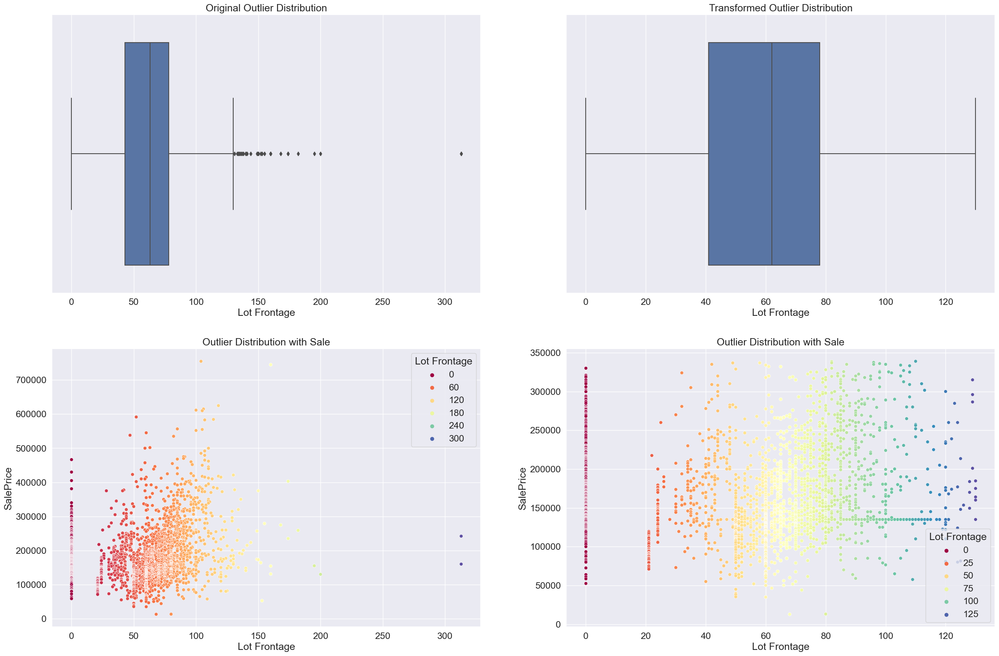

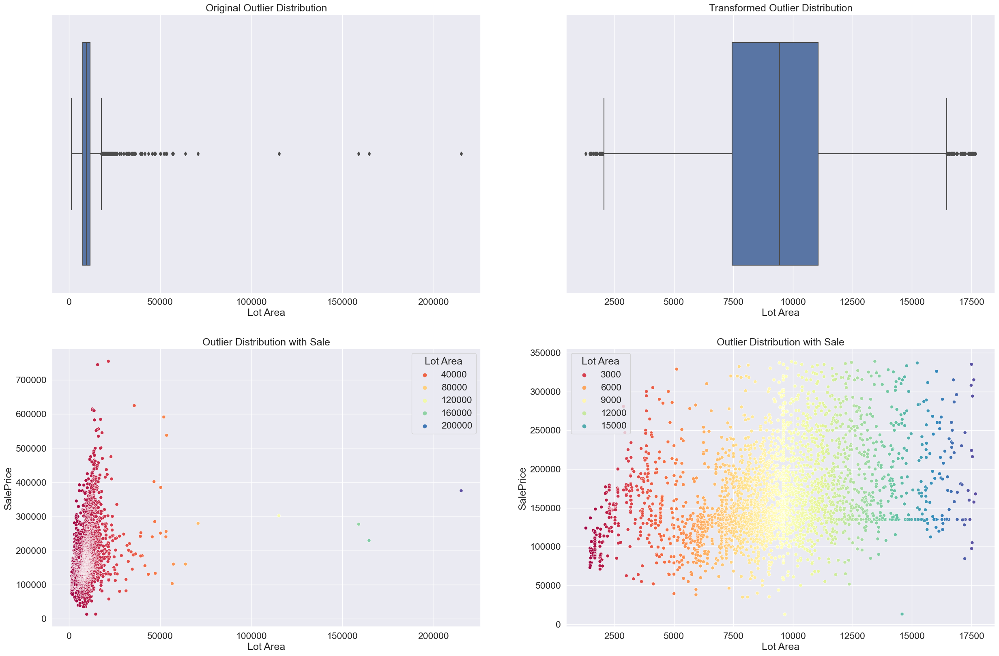

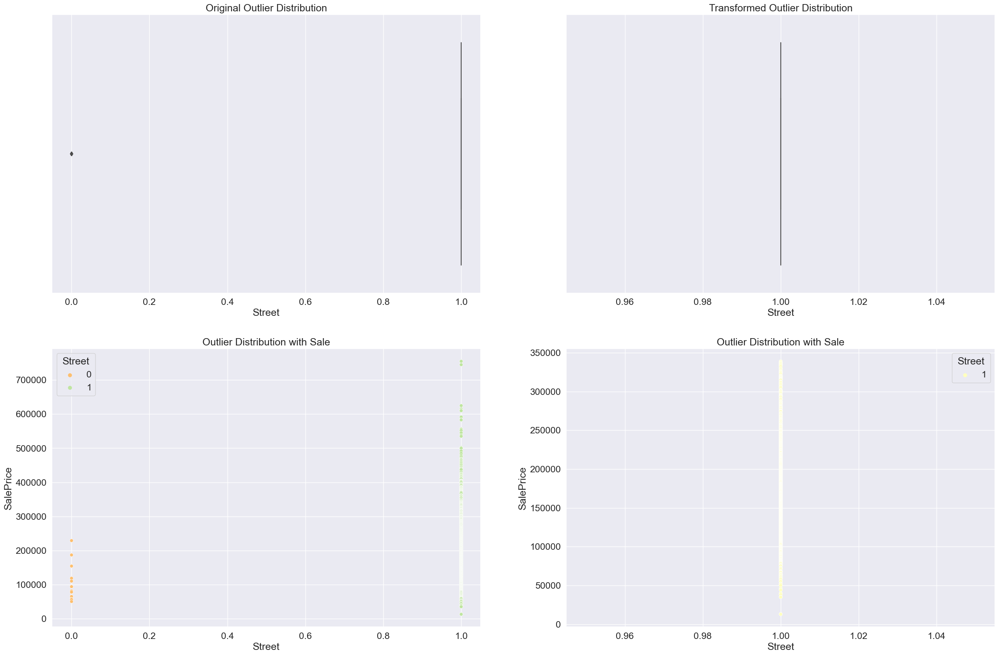

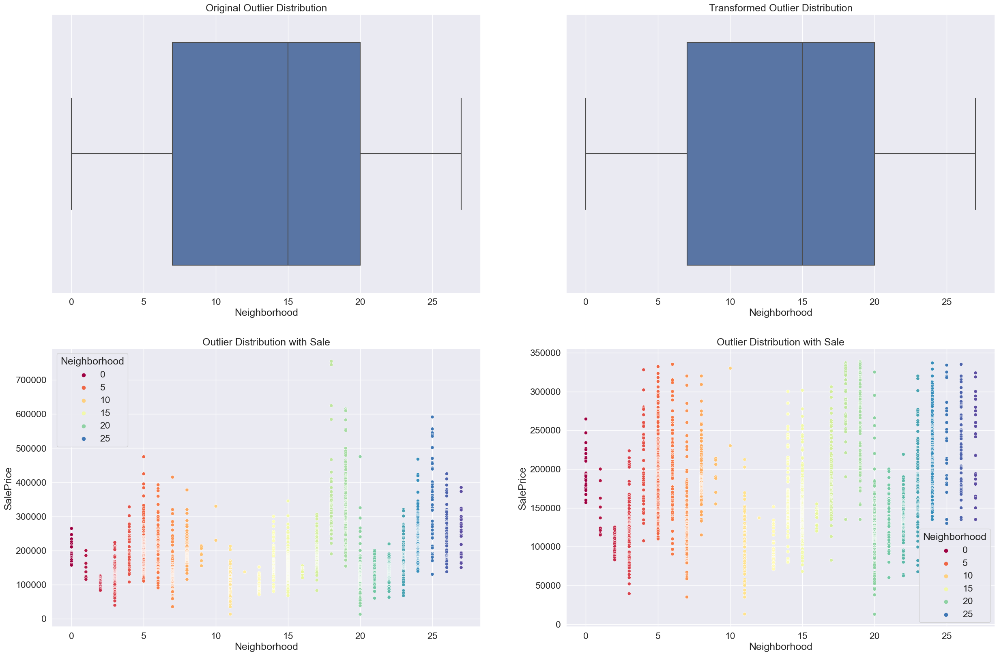

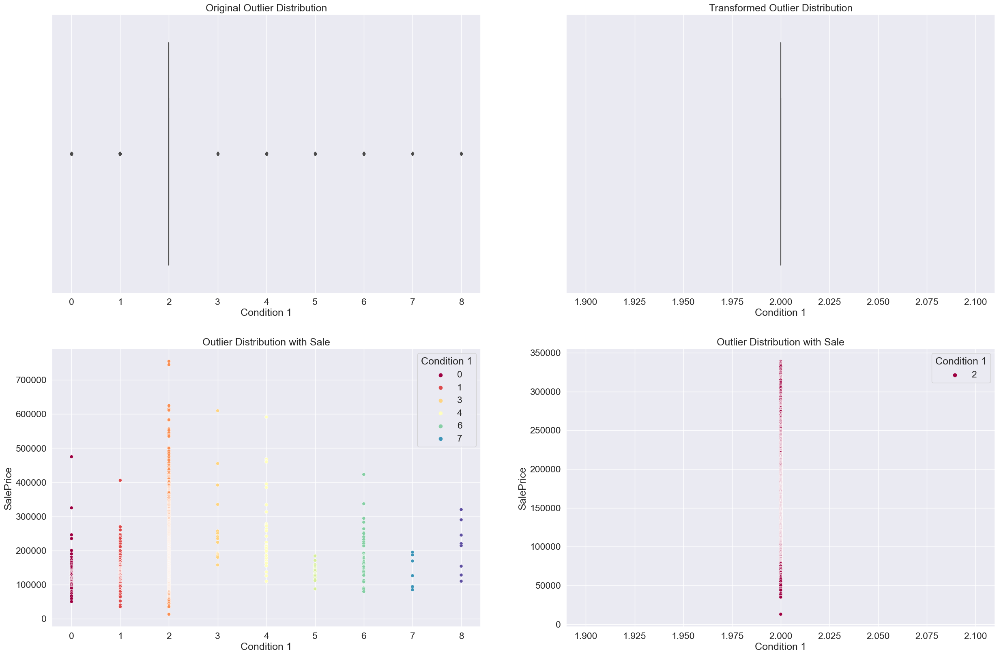

...

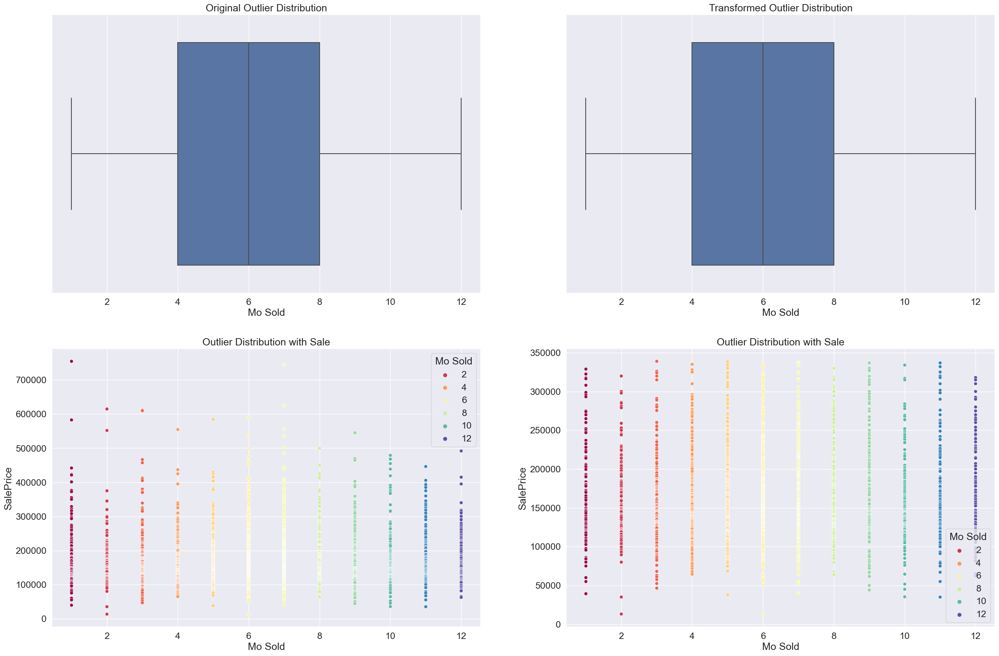

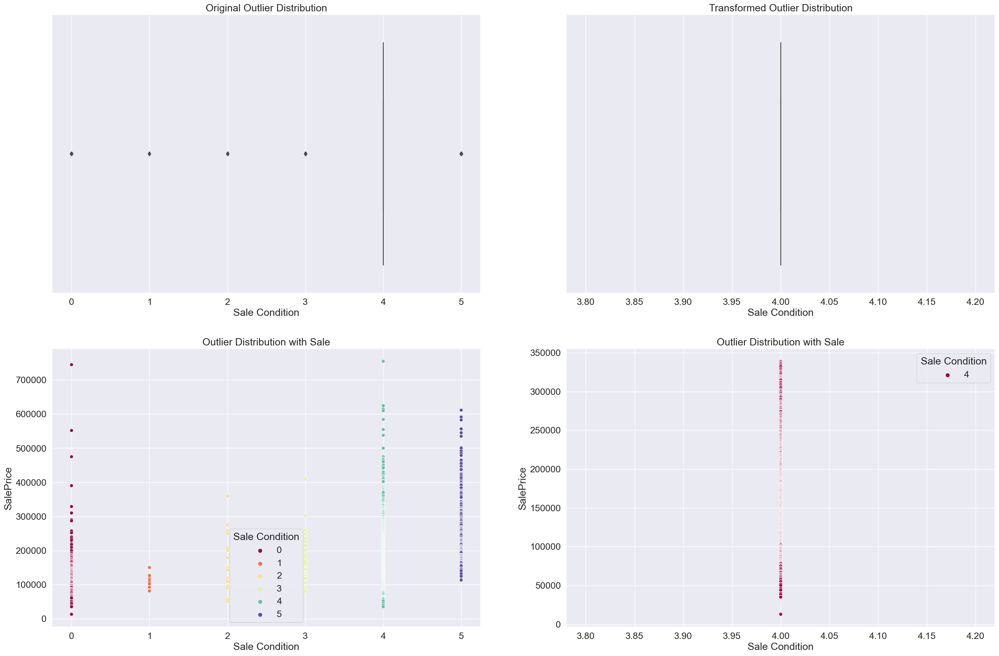

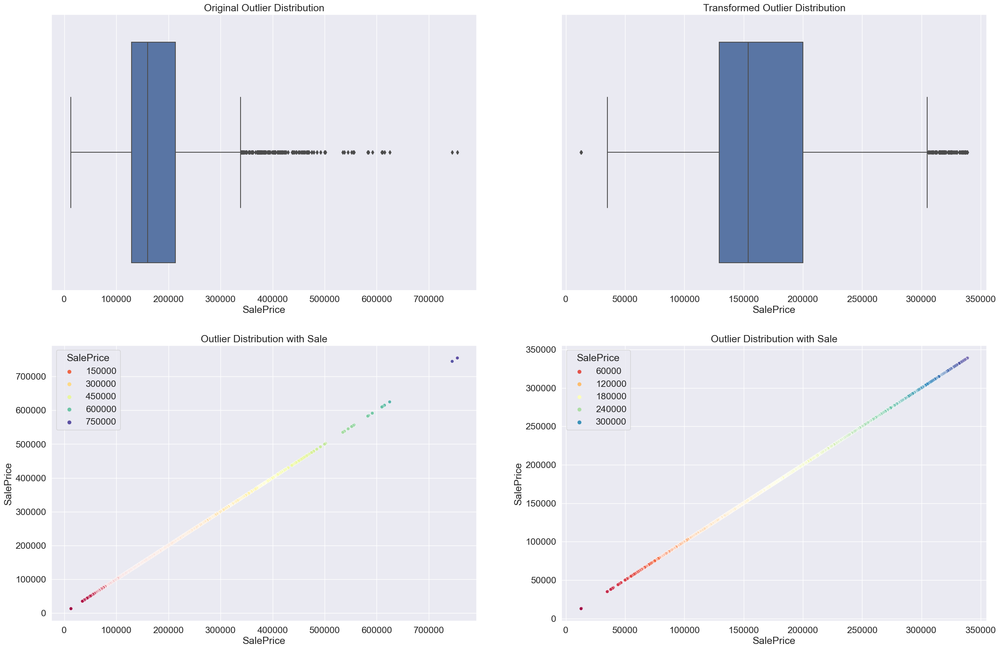

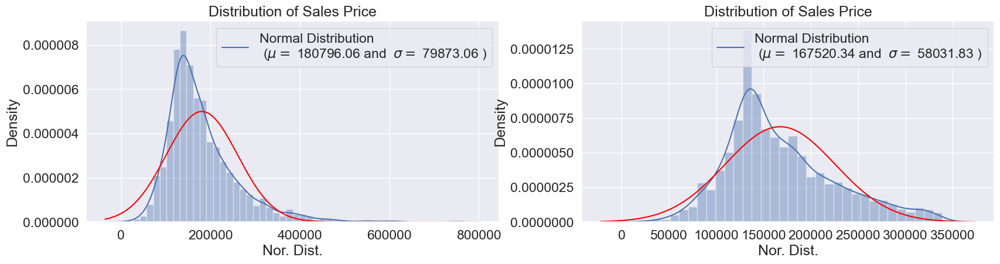

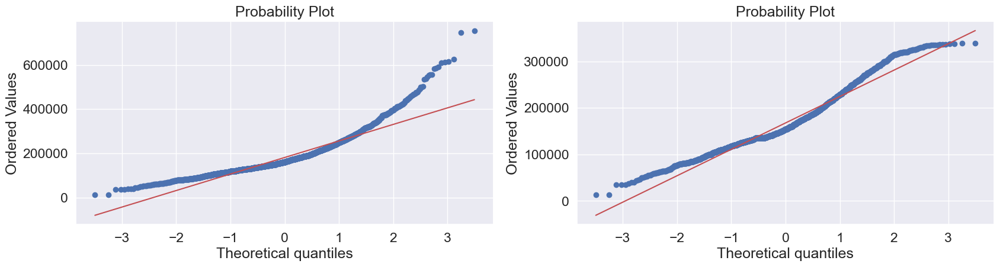

In [23]:
df_numeric = df_transformed.select_dtypes(exclude='object')
for col in df_numeric.columns: # Iterate over each Column and Create Visuals
########## New Figure ######################################################################################################
    figa = plt.figure(figsize=(30, 20))
    sns.set(font_scale=1.5)

    fig1 = figa.add_subplot(221); sns.boxplot(df[col])
    fig1 = plt.title('Original Outlier Distribution')
    
    fig2 = figa.add_subplot(222); sns.boxplot(df_transformed[col])
    fig2 = plt.title('Transformed Outlier Distribution')
    
    fig3 = figa.add_subplot(223); 
    sns.scatterplot(x = df[col], y = df[target], hue=df[col], palette= 'Spectral')
    fig3 = plt.title('Outlier Distribution with Sale')
    
    fig4 = figa.add_subplot(224); 
    sns.scatterplot(x = df_transformed[col], y = df_transformed[target], hue=df_transformed[col], palette= 'Spectral')
    fig4 = plt.title('Outlier Distribution with Sale')

########## New Figure ######################################################################################################
figb = plt.figure(figsize=(20, 10))
sns.set(font_scale=1.5)

fig5 = figb.add_subplot(221); 
fig5 = sns.distplot(df[target][~df[target].isnull()], axlabel="Nor. Dist.", fit=st.norm, fit_kws={"color":"red"})
fig5 = plt.title('Distribution of Sales Price')
(mu5, sigma5) = st.norm.fit(df[target])
fig5 = plt.legend(['Normal Distribution \n ($\mu=$ {:.2f} and  $\sigma=$ {:.2f} )'.format(mu5, sigma5)], loc='best', fancybox=True)

fig6 = figb.add_subplot(222);
fig6 = sns.distplot(df_transformed[target][~df_transformed[target].isnull()], axlabel="Nor. Dist.", fit=st.norm, fit_kws={"color":"red"})
fig6 = plt.title('Distribution of Sales Price')
(mu6, sigma6) = st.norm.fit(df_transformed[target])
fig6 = plt.legend(['Normal Distribution \n ($\mu=$ {:.2f} and  $\sigma=$ {:.2f} )'.format(mu6, sigma6)], loc='best', fancybox=True)

########## New Figure ######################################################################################################
figc = plt.figure(figsize=(20, 10))
sns.set(font_scale=1.5)
fig7 = figc.add_subplot(221); 
fig7 = st.probplot(df[target][~df[target].isnull()], plot=plt)
fig7 = plt.title('Probability Plot')

fig8 = figc.add_subplot(222); 
fig8 = st.probplot(df_transformed[target][~df_transformed[target].isnull()], plot=plt)
fig8 = plt.title('Probability Plot')


<div class="alert alert-block alert-warning">
<H4>
Copy Data to New Dataframe
</H4></div>

In [24]:
df_encoded = df_transformed.copy()

<div class="alert alert-block alert-warning">
<H4>
Split data into 'X' and 'y'
</H4></div>

In [25]:
data = df_encoded.values
#print(type(df_encoded))
X, y = data[:, :-1], data[:, -1]
print(X.shape, y.shape)

(2930, 45) (2930,)


<div class="alert alert-block alert-success">
<H4>
Provide Method to 'Split Training and Testing Dataset'
</H4></div>

In [26]:
def split_data(df_encoded):
    X = df_encoded.loc[ : , df_encoded.columns != target]
    y = df_encoded[target].astype('float')
    return train_test_split(X, y, test_size= 1/3,random_state = rs)# test_size= 1/3, stratify=y,

<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> Split Data into Test & Train Set: </span>
</H4></div>

In [27]:
X_train, X_test, y_train, y_test = split_data(df_encoded) # Call the Method to Split Training and Testing Dataset
X_test

,Lot Frontage,Lot Area,Street,Neighborhood,Condition 1,Condition 2,House Style,Overall Qual,Year Built,Year Remod/Add,...,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Fence,Misc Feature,Mo Sold,Sale Condition
2754,86.0,11210,1,5,2,2,2,7,2005,2006,...,865.0,4,4,2,144,59,4,5,7,4
1174,79.0,10646,1,24,2,2,5,7,2001,2001,...,546.0,4,4,2,0,0,4,5,6,4
1057,104.0,14418,1,19,2,2,2,9,2007,2007,...,706.0,4,4,2,156,0,4,5,5,4
2826,35.0,3675,1,7,2,2,6,6,2005,2006,...,525.0,4,4,2,0,44,4,5,6,4
216,72.0,10773,1,22,2,2,2,4,1967,1967,...,0.0,4,4,2,0,58,4,5,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,66.0,12400,1,15,2,2,2,6,1958,1998,...,297.0,4,4,2,0,0,4,5,6,4
2919,21.0,1936,1,13,2,2,5,4,1970,1970,...,0.0,4,4,2,0,0,4,5,6,4
2578,69.0,14850,1,15,2,2,2,5,1957,1957,...,299.0,4,4,2,268,0,4,5,5,4
176,60.0,7200,1,20,2,2,2,5,1940,1992,...,240.0,4,4,2,0,0,4,5,2,4


<div class="alert alert-block alert-success">
<H4>
Method to 'Evaluate Model Results'
</H4></div>

<div class="alert alert-block alert-warning">
<H5>
1) Use cross_val_score function of Sklearn<br>
2) Calculate the Root-Mean-Squared Error (RMSE) as a measure of accuracy
</H5></div>

In [28]:
from sklearn import tree, model_selection
# https://www.projectpro.io/recipes/use-regression-metrics-in-python
n_folds =20
def result(model):
    kf = KFold(n_folds, shuffle=True, random_state=rs).get_n_splits(X_train.values)
    scoring = "neg_mean_squared_error"# , "neg_mean_absolute_error" , "r2"
    result = model_selection.cross_val_score(model, X_train.values, y_train, cv=kf, scoring=scoring)
    result = result.mean()
    #result= np.sqrt(-cross_val_score(model, X_train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(result)

<div class="alert alert-block alert-danger">
<H2>   
RIDGE REGRESSION MODELS
</H2></div>

<div class="alert alert-block alert-success">
<H4>
Random Search Method to Find 'Best Parameters'to 'Build Ridge Regression Model WITH Optimal Hyperparameters'
</H4></div>

In [29]:
def random_search_r(X_train, y_train):

    # Define Evaluation
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

    # Define Search Space
    space = dict()
    space['solver'] = ['auto','svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']
    space['alpha'] = loguniform(1e-5, 100)
    space['fit_intercept'] = [True, False]
    space['normalize'] = [True, False]
    space['max_iter'] = [500, 1000, 1500]
    
    # Define Model
    ridge_model = Ridge(random_state=rs, max_iter=1000)

    # Define Search
    search = RandomizedSearchCV(ridge_model, space, n_iter=500, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

    # Execute Search
    result_r = search.fit(X_train, y_train)

    # Summarize Result
    best_score_r = result_r.best_score_
    
    best_params_r = result_r.best_params_
    best_params_r["best_score"] = best_score_r # Add 'best_score' to 'best_params' Dictionary

    best_params_r = pd.DataFrame([best_params_r]) # Dictionary To dataframe

    # Get Optimal Variables
    opt_alpha_r = best_params_r['alpha'].iloc[0]
    opt_alpha_r = '{:.6f}'.format(opt_alpha_r)
    opt_alpha_r = float(opt_alpha_r) # Back to Float

    opt_solver_r = best_params_r['solver'].iloc[0]
    opt_fit_intercept_r = best_params_r['fit_intercept'].iloc[0]
    opt_normalize_r = best_params_r['normalize'].iloc[0]
    opt_max_iter_r = best_params_r['max_iter'].iloc[0]

    # Define Optimal Parameters
    optimal_params_r = {'solver': opt_solver_r,
                                        'alpha': opt_alpha_r,
                                        'fit_intercept': opt_fit_intercept_r,
                                        'normalize': opt_normalize_r,
                                        'max_iter': opt_max_iter_r,
                                        'random_state': rs}
    
    return best_params_r, optimal_params_r

best_params_r, optimal_params_r = random_search_r(X_train, y_train) # Call Method 'random_search_r' to get optimal hyperparameters
best_params_r

,alpha,fit_intercept,max_iter,normalize,solver,best_score
0,75.322052,True,500,False,auto,-23514.379169


<div class="alert alert-block alert-success">
<H4>
Method to 'Build  Ridge Regression WITH & Without Optimal Hyperparameters'
</H4></div>

In [30]:
# Build a Regression model with Optimal Class Weights
def build_op_r(X_train, y_train, X_test, threshold=0.5, best_params=None):
    
    model = Ridge(random_state=rs, max_iter = 1000)   
    
    # If best parameters are provided
    if best_params:
        model = make_pipeline(RobustScaler(), 
                              Ridge(solver = best_params_r['solver'].iloc[0],
                                    alpha = best_params_r['alpha'].iloc[0],
                                    fit_intercept = best_params_r['fit_intercept'].iloc[0],
                                    normalize = best_params_r['normalize'].iloc[0],
                                    max_iter = best_params_r['max_iter'].iloc[0],
                                    random_state=rs
                                          )
                             )
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
        
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model[:-1].get_feature_names_out()        
        X_train_preprocessed = pd.DataFrame(model[:-1].transform(X_train), columns=feature_names) # X_train to compute standard deviation of the related feature       
        features = pd.DataFrame(model[-1].coef_ * X_train_preprocessed.std(axis=0), columns=["Coefficients"], index=feature_names,)   
        
        
    else:
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model._check_feature_names       
        X_train_preprocessed = X_train.copy() #.T # Transpose X_train to compute standard deviation of the related feature       
        
        # Multiply model coefficients by std of features to reduce all coefficients to same unit of measure.
        features  = pd.DataFrame(model.coef_ * X_train_preprocessed.std(axis=0), columns=['Coefficients'], index=X_train.columns) 
    
    features['Features'] = features.index
    #features = features.loc[features['Coefficients'] > 0] # Uncomment if only features with Coeff > 0 are required
    features  = features.sort_values(by=['Coefficients'], ascending=False).reset_index(drop=True)    
   
    # Plot Features
    data = features.copy()
    data = data[data["Coefficients"] != 0]
    data.set_index('Features', inplace=True)
    data.plot.barh(figsize=(30,10), color='green')

    title = "Feature Importance in Predicting " + target
    plt.title(title)
    plt.axvline(x=0, color="red")
    plt.xlabel("Coefficient Values Corrected by Features' std. dev.")
    plt.subplots_adjust(left=0.3)

    # Get Model Results
    res = result(model)    
    
    return model, res, features, pred

<div class="alert alert-block alert-info">
<H4>
Model 1: RIDGE Without `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_check_feature_names', '_check_n_features', '_decision_function', '_estimator_type', '_get_param_names', '_get_tags', '_more_tags', '_normalize', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_set_intercept', '_validate_data', 'alpha', 'coef_', 'copy_X', 'feature_names_in_', 'fit', 'fit_intercept', 'get_params', 'intercept_', 'max_iter', 'n_features_in_', 'n_iter_', 'normalize', 'positive', 'predict', 'random_state', 'score', 'set_params', 'solver', 'tol']


,SCORE,MODEL,MODEL#
0,-1.30784598e+09,Regression,Model 1


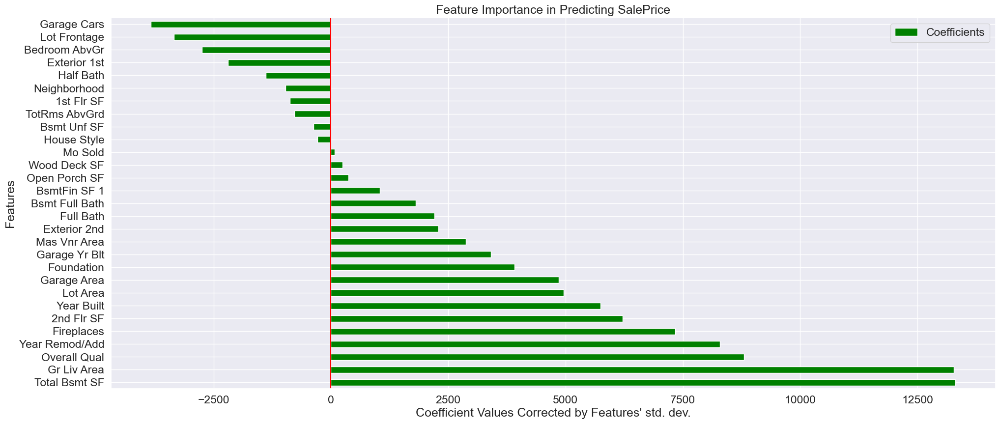

In [31]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model1, res1, features1, pred1 = build_op_r(X_train, y_train, X_test, best_params=None) # Call Method to 'Build Logistic Regression WITH Class Weights'


#Collect & Append Results
r1 = np.array2string(res1)####
r1 = pd.DataFrame([r1.split(';') for x in r1.split('\n')])
r1 = r1.rename(columns={0: 'SCORE'}) 
r1['MODEL'] = 'Regression'
r1['MODEL#'] = 'Model 1'
r1

<div class="alert alert-block alert-info">
<H4>
Model 2: RIDGE With `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_is_fitted__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_can_inverse_transform', '_can_transform', '_check_feature_names', '_check_fit_params', '_check_n_features', '_estimator_type', '_final_estimator', '_fit', '_get_param_names', '_get_params', '_get_tags', '_iter', '_log_message', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_set_params', '_sk_visual_block_', '_validate_data', '_validate_names', '_validate_steps', 'classes_', 'decision_function', 'feature_names_in_', 'fit', 

,SCORE,MODEL,MODEL#
0,-1.30393778e+09,Regression Optimal,Model 2


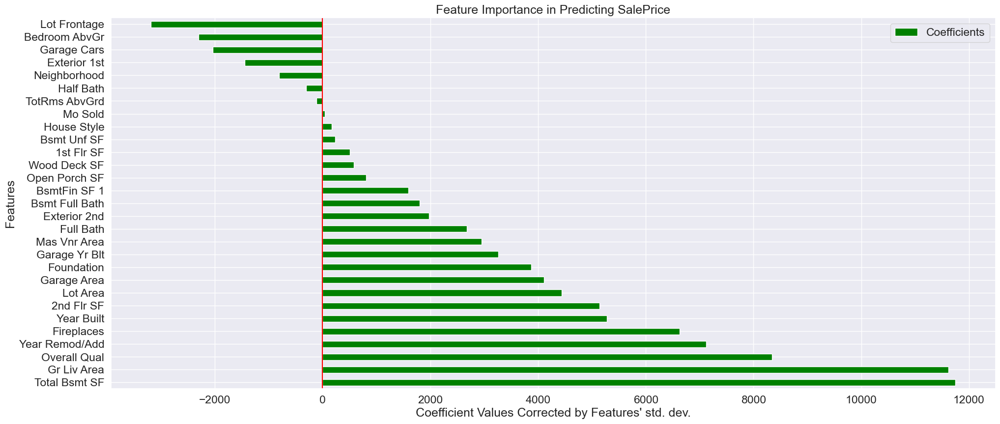

In [32]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model2, res2, features2, pred2 = build_op_r(X_train, y_train, X_test, best_params=optimal_params_r) # Call Method to 'Build Logistic Regression WITH Class Weights'

#Collect & Append Results
r2 = np.array2string(res2)####
r2 = pd.DataFrame([r2.split(';') for x in r2.split('\n')])
r2 = r2.rename(columns={0: 'SCORE'}) 
r2['MODEL'] = 'Regression Optimal'
r2['MODEL#'] = 'Model 2'
r2

<div class="alert alert-block alert-danger">
<H2>   
LASSO REGRESSION MODELS
</H2></div>
<div class="alert alert-block alert-success">
<H4>
Random Search Method to Find 'Best Parameters'to 'Build Lasso Regression Model WITH Optimal Hyperparameters'
</H4></div>

In [33]:
def random_search_l(X_train, y_train):    

    # Define Evaluation
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

    # Define Search Space
    space = dict()
    space['alpha'] = loguniform(1e-5, 100)
    space['fit_intercept'] = [True, False]
    space['normalize'] = [True, False]
    space['precompute'] = [True, False]
    space['tol'] = loguniform(1e-4, 100)
    space['selection'] = ['cyclic', 'random']

    # Define Model
    lasso_model = Lasso(random_state=rs, max_iter=1000)

    # Define Search
    search = RandomizedSearchCV(lasso_model, space, n_iter=1000, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

    # Execute Search
    result_l = search.fit(X_train, y_train)

    # Summarize Result
    best_score_l = result_l.best_score_
    best_params_l = result_l.best_params_
    best_params_l["best_score"] = best_params_l # Add 'best_score' to 'best_params' Dictionary

    best_params_l = pd.DataFrame([best_params_l]) # Dictionary To dataframe    

    # Get Optimal Variables
    opt_alpha_l = best_params_l['alpha'].iloc[0]
    opt_fit_intercept_l = best_params_l['fit_intercept'].iloc[0]
    opt_normalize_l = best_params_l['normalize'].iloc[0]
    opt_precompute_l = best_params_l['precompute'].iloc[0]
    opt_tol_l = best_params_l['tol'].iloc[0]
    opt_selection_l = best_params_l['selection'].iloc[0]

    # Define Optimal Parameters
    optimal_params_l = {'alpha': opt_alpha_l,
                                        'fit_intercept': opt_fit_intercept_l,
                                        'normalize': opt_normalize_l,
                                        'precompute': opt_precompute_l,
                                        'tol': opt_tol_l,
                                        'selection': opt_selection_l}
    
    
    return best_params_l, optimal_params_l

best_params_l, optimal_params_l = random_search_l(X_train, y_train) # Call Method 'random_search_l' to get optimal hyperparameters
best_params_l

,alpha,fit_intercept,normalize,precompute,selection,tol,best_score
0,9.126019,True,True,False,random,0.031602,"{'alpha': 9.126018989876911, 'fit_intercept': ..."


<div class="alert alert-block alert-success">
<H4>
Method to 'Build  LASSO Regression WITH & Without Optimal Hyperparameters'
</H4></div>

In [34]:
# Build a LASSO model with Optimal Class Weights
def build_op_l(X_train, y_train, X_test, threshold=0.5, best_params=None):
    
    model = Ridge(random_state=rs, max_iter = 1000) 
    
    # If best parameters are provided
    if best_params:
        model = make_pipeline(RobustScaler(), 
                              Lasso(alpha = best_params_l['alpha'].iloc[0],  
                                    fit_intercept = best_params_l['fit_intercept'].iloc[0],  
                                    normalize = best_params_l['normalize'].iloc[0],  
                                    precompute = best_params_l['precompute'].iloc[0],  
                                    tol = best_params_l['tol'].iloc[0],  
                                    selection = best_params_l['selection'].iloc[0],  
                                    random_state=rs
                                          )
                             )
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model[:-1].get_feature_names_out() #https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html        
        X_train_preprocessed = pd.DataFrame(model[:-1].transform(X_train), columns=feature_names) # X_train to compute standard deviation of the related feature
        features = pd.DataFrame(model[-1].coef_ * X_train_preprocessed.std(axis=0), columns=["Coefficients"], index=feature_names,)

    else:
        model.fit(X_train, y_train) 
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model._check_feature_names       
        X_train_preprocessed = X_train.copy() #.T # Transpose X_train to compute standard deviation of the related feature       
        # Multiply model coefficients by std of features to reduce all coefficients to same unit of measure.
        features  = pd.DataFrame(model.coef_ * X_train_preprocessed.std(axis=0), columns=['Coefficients'], index=X_train.columns)     
    
    features['Features'] = features.index
    #features = features.loc[features['Coefficients'] > 0] # Uncomment if only features with Coeff > 0 are required
    features  = features.sort_values(by=['Coefficients'], ascending=False).reset_index(drop=True)    

    # Plot Features
    data = features.copy()
    data = data[data["Coefficients"] != 0]
    data.set_index('Features', inplace=True)
    data.plot.barh(figsize=(30,10), color='green')

    title = "Feature Importance in Predicting " + target
    plt.title(title)
    plt.axvline(x=0, color="red")
    plt.xlabel("Coefficient Values Corrected by Features' std. dev.")
    plt.subplots_adjust(left=0.3)
    
    # Get Model Results
    res = result(model)        
    
    return model, res, features, pred

<div class="alert alert-block alert-info">
<H4>
Model 3: LASSO Without `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_check_feature_names', '_check_n_features', '_decision_function', '_estimator_type', '_get_param_names', '_get_tags', '_more_tags', '_normalize', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_set_intercept', '_validate_data', 'alpha', 'coef_', 'copy_X', 'feature_names_in_', 'fit', 'fit_intercept', 'get_params', 'intercept_', 'max_iter', 'n_features_in_', 'n_iter_', 'normalize', 'positive', 'predict', 'random_state', 'score', 'set_params', 'solver', 'tol']


,SCORE,MODEL,MODEL#
0,-1.30784598e+09,Lasso,Model 3


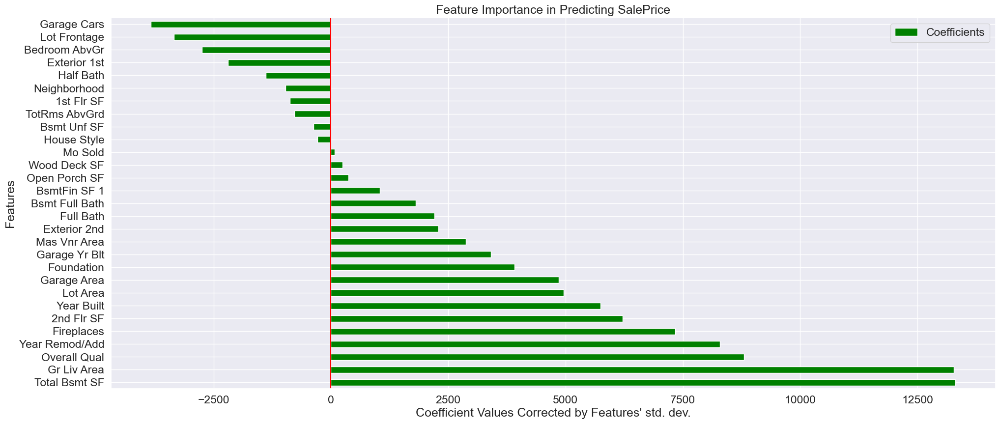

In [35]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model3, res3, features3, pred3 = build_op_l(X_train, y_train, X_test, best_params=None) # Call Method to 'Build Logistic Regression WITH Class Weights'

#Collect & Append Results
r3 = np.array2string(res3)####
r3 = pd.DataFrame([r3.split(';') for x in r3.split('\n')])
r3 = r3.rename(columns={0: 'SCORE'}) 
r3['MODEL'] = 'Lasso'
r3['MODEL#'] = 'Model 3'
r3

<div class="alert alert-block alert-info">
<H4>
Model 4: LASSO With `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_is_fitted__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_can_inverse_transform', '_can_transform', '_check_feature_names', '_check_fit_params', '_check_n_features', '_estimator_type', '_final_estimator', '_fit', '_get_param_names', '_get_params', '_get_tags', '_iter', '_log_message', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_set_params', '_sk_visual_block_', '_validate_data', '_validate_names', '_validate_steps', 'classes_', 'decision_function', 'feature_names_in_', 'fit', 

,SCORE,MODEL,MODEL#
0,-1.3033701e+09,Lasso Optimal,Model 4


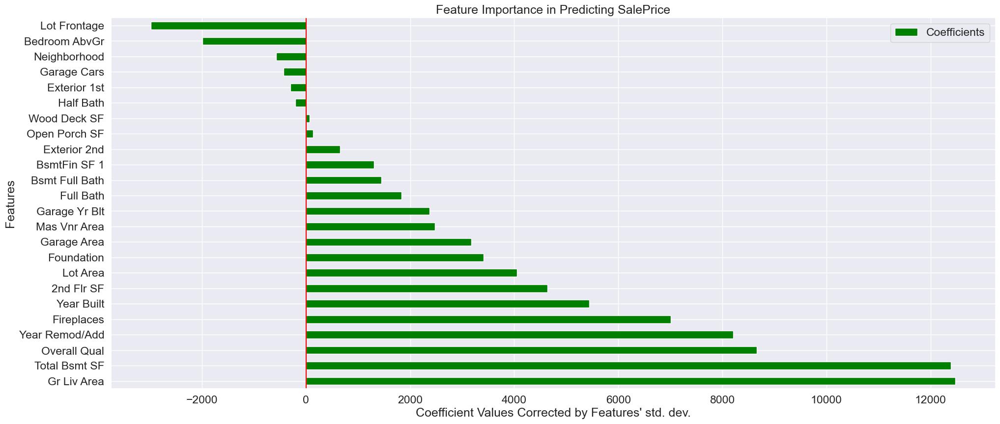

In [36]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model4, res4, features4, pred4 = build_op_l(X_train, y_train, X_test, best_params=optimal_params_l) # Call Method to 'Build Logistic Regression WITH Class Weights'

#Collect & Append Results
r4 = np.array2string(res4)####
r4 = pd.DataFrame([r4.split(';') for x in r4.split('\n')])
r4 = r4.rename(columns={0: 'SCORE'}) 
r4['MODEL'] = 'Lasso Optimal'
r4['MODEL#'] = 'Model 4'
r4

<div class="alert alert-block alert-danger">
<H2>   
ELASTIC-NET REGRESSION MODELS
</H2></div>

<div class="alert alert-block alert-success">
<H4>
Randomized Search Method to Find 'Best Parameters'to 'Build Elastic Net Regression Model WITH Optimal Hyperparameters'
</H4></div>

In [37]:
def random_search_en(X_train, y_train):  
    
    # Define Evaluation
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

    # Define Search Space
    space = dict()
    space['alpha'] = loguniform(1.0, 1.5, 3, 3.5)
    space['l1_ratio'] = loguniform(0.5, 1)
    space['fit_intercept'] = [True, False]
    space['normalize'] = [True, False]
    space['precompute'] = [True, False]
    space['copy_X'] = [True, False]
    space['tol'] = [1e-4, 1e-6, 1e-9]
    space['warm_start'] = [True, False]
    space['positive'] = [True, False]
    space['selection'] = ['cyclic', 'random']

    # Define Model
    en_model = ElasticNet(random_state=rs, max_iter=1000)

    # Define Search
    search_en = RandomizedSearchCV(en_model, space, n_iter=1000, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

    # Execute Search
    result_en = search_en.fit(X_train, y_train)

    # Summarize Result
    best_score_en= result_en.best_score_

    best_params_en = result_en.best_params_
    best_params_en["best_score"] = best_params_en # Add 'best_score' to 'best_params' Dictionary
    best_params_en = pd.DataFrame([best_params_en]) # Dictionary To dataframe

    # Get Optimal Variables
    opt_alpha_en = best_params_en['alpha'].iloc[0]
    opt_l1_ratio_en = best_params_en['l1_ratio'].iloc[0]
    opt_fit_intercept_en = best_params_en['fit_intercept'].iloc[0]
    opt_normalize_en = best_params_en['normalize'].iloc[0]
    opt_precompute_en = best_params_en['precompute'].iloc[0]
    opt_copy_X_en = best_params_en['copy_X'].iloc[0]
    opt_tol_en = best_params_en['tol'].iloc[0]
    opt_tol_en= best_params_en['tol'].iloc[0]
    opt_warm_start_en = best_params_en['warm_start'].iloc[0]
    opt_positive_en = best_params_en['positive'].iloc[0]
    opt_selection_en = best_params_en['selection'].iloc[0]

    # Define Optimal Parameters
    optimal_params_en = {'alpha': opt_alpha_en,
                                        'l1_ratio': opt_l1_ratio_en,
                                        'fit_intercept': opt_fit_intercept_en,
                                        'normalize': opt_normalize_en,
                                        'precompute': opt_precompute_en,
                                        'copy_X': opt_copy_X_en,
                                        'tol': opt_tol_en,
                                        'warm_start': opt_warm_start_en,
                                        'positive': opt_positive_en,
                                        'selection': opt_selection_en}
    return best_params_en, optimal_params_en

best_params_en, optimal_params_en = random_search_en(X_train, y_train) # Call Function 'random_search_en' to get optimal hyperparameters
best_params_en

,alpha,copy_X,fit_intercept,l1_ratio,normalize,positive,precompute,selection,tol,warm_start,best_score
0,6.9506,True,True,0.987434,False,True,False,random,1.000000e-09,True,"{'alpha': 6.950599680152801, 'copy_X': True, '..."


<div class="alert alert-block alert-success">
<H4>
Method to 'Build  ELASTIC-NET Regression WITH & Without Optimal Hyperparameters'
</H4></div>

In [38]:
# Build a LASSO model with Optimal Class Weights
def build_op_en(X_train, y_train, X_test, threshold=0.5, best_params=None):
    
    model = ElasticNet(random_state=rs, max_iter = 1000)  
    
    # If best parameters are provided
    if best_params:
        model = make_pipeline(RobustScaler(), 
                              ElasticNet(alpha = best_params_en['alpha'].iloc[0],  
                                    l1_ratio = best_params_en['l1_ratio'].iloc[0],
                                    fit_intercept = best_params_en['fit_intercept'].iloc[0],
                                    normalize = best_params_en['normalize'].iloc[0],
                                    precompute = best_params_en['precompute'].iloc[0],
                                    copy_X = best_params_en['copy_X'].iloc[0],
                                    tol = best_params_en['tol'].iloc[0],
                                    warm_start = best_params_en['warm_start'].iloc[0],
                                    positive = best_params_en['positive'].iloc[0],
                                    selection = best_params_en['selection'].iloc[0]
                                          )
                             )
        
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model[:-1].get_feature_names_out() #https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html        
        X_train_preprocessed = pd.DataFrame(model[:-1].transform(X_train), columns=feature_names) # X_train to compute standard deviation of the related feature
        features = pd.DataFrame(model[-1].coef_ * X_train_preprocessed.std(axis=0), columns=["Coefficients"], index=feature_names,)

    else:
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model._check_feature_names       
        X_train_preprocessed = X_train.copy() #.T # Transpose X_train to compute standard deviation of the related feature       
        # Multiply model coefficients by std of features to reduce all coefficients to same unit of measure.
        features  = pd.DataFrame(model.coef_ * X_train_preprocessed.std(axis=0), columns=['Coefficients'], index=X_train.columns) 
    
    features['Features'] = features.index
    #features = features.loc[features['Coefficients'] > 0] # Uncomment if only features with Coeff > 0 are required
    features  = features.sort_values(by=['Coefficients'], ascending=False).reset_index(drop=True)    

    # Plot Features
    data = features.copy()
    data = data[data["Coefficients"] != 0]
    data.set_index('Features', inplace=True)
    data.plot.barh(figsize=(30,10), color='green')

    title = "Feature Importance in Predicting " + target
    plt.title(title)
    plt.axvline(x=0, color="red")
    plt.xlabel("Coefficient Values Corrected by Features' std. dev.")
    plt.subplots_adjust(left=0.3)
    
    # Get Model Results
    res = result(model)        
    
    return model, res, features, pred

<div class="alert alert-block alert-info">
<H4>
Model 5: ELASTIC-NET Without `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_check_feature_names', '_check_n_features', '_decision_function', '_estimator_type', '_get_param_names', '_get_tags', '_more_tags', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_set_intercept', '_validate_data', 'alpha', 'coef_', 'copy_X', 'dual_gap_', 'feature_names_in_', 'fit', 'fit_intercept', 'get_params', 'intercept_', 'l1_ratio', 'max_iter', 'n_features_in_', 'n_iter_', 'normalize', 'path', 'positive', 'precompute', 'predict', 'random_state', 'score', 'selection', 'set_params', 'sparse_coef_', 'tol', 'warm_start']


,SCORE,MODEL,MODEL#
0,-1.32680508e+09,Elastic-Net,Model 5


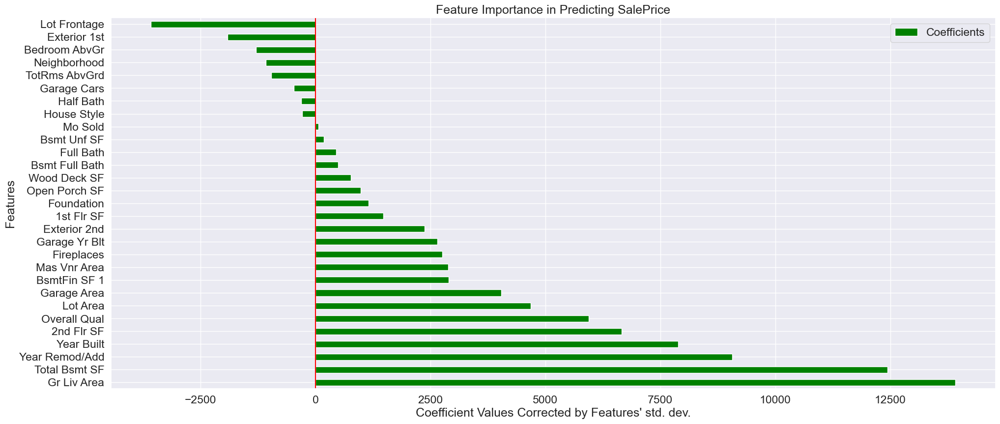

In [39]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model5, res5, features5, pred5 = build_op_en(X_train, y_train, X_test, best_params=None) # Call Method to 'Build Logistic Regression WITH Class Weights'

#Collect & Append Results
r5 = np.array2string(res5)####
r5 = pd.DataFrame([r5.split(';') for x in r5.split('\n')])
r5 = r5.rename(columns={0: 'SCORE'}) 
r5['MODEL'] = 'Elastic-Net'
r5['MODEL#'] = 'Model 5'
r5

<div class="alert alert-block alert-info">
<H4>
Model 6: ELASTIC-NET With `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_is_fitted__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_can_inverse_transform', '_can_transform', '_check_feature_names', '_check_fit_params', '_check_n_features', '_estimator_type', '_final_estimator', '_fit', '_get_param_names', '_get_params', '_get_tags', '_iter', '_log_message', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_set_params', '_sk_visual_block_', '_validate_data', '_validate_names', '_validate_steps', 'classes_', 'decision_function', 'feature_names_in_', 'fit', 

,SCORE,MODEL,MODEL#
0,-1.32126229e+09,Elastic-Net Optimal,Model 6


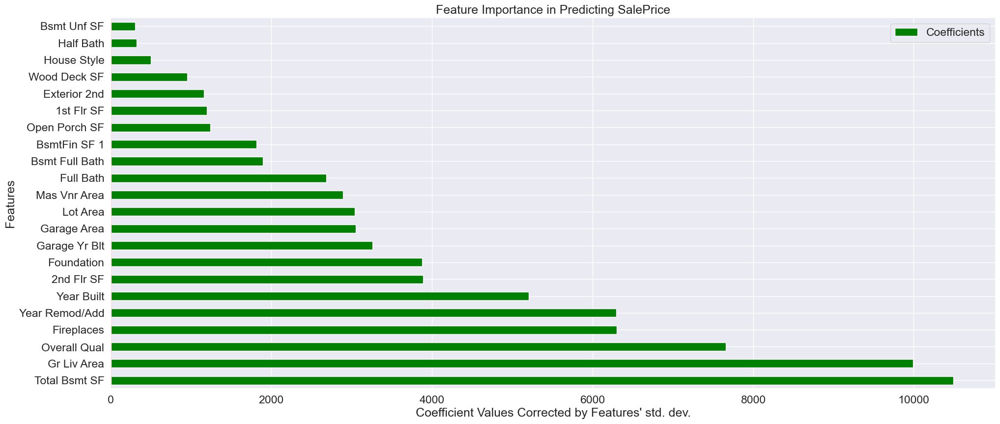

In [40]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model6, res6, features6, pred6 = build_op_en(X_train, y_train, X_test, best_params=optimal_params_en) # Call Method to 'Build Logistic Regression WITH Class Weights'

#Collect & Append Results
r6 = np.array2string(res6)####
r6 = pd.DataFrame([r6.split(';') for x in r6.split('\n')])
r6 = r6.rename(columns={0: 'SCORE'}) 
r6['MODEL'] = 'Elastic-Net Optimal'
r6['MODEL#'] = 'Model 6'
r6

<div class="alert alert-block alert-danger">
<H2>   
XGBOOST REGRESSION MODELS
</H2></div>

<div class="alert alert-block alert-success">
<H4>
Random Search Method to Find 'Best Parameters'to 'Build XGBoost Regression Model WITH Optimal Hyperparameters'
</H4></div>

In [41]:
 def random_search_xgb(X_train, y_train):  
    
    # Define Evaluation
    cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

    # Define Search Space
    space = dict()
    space['learning_rate'] = [0.1, 20]
    space['subsample'] = [0.0, 1.0]
    space['criterion'] = ['friedman_mse', 'squared_error', 'mse']
    space['max_features'] = ['auto', 'sqrt', 'log2']

    # Define Model
    xgb_model = GradientBoostingRegressor(random_state=rs)

    # Define Search
    search_xgb = RandomizedSearchCV(xgb_model, space, n_iter=1000, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=rs)

    # Execute Search
    result_xgb = search_xgb.fit(X_train, y_train)

    # Summarize Result
    best_score_xgb= result_xgb.best_score_
    best_params_xgb = result_xgb.best_params_
    best_params_xgb["best_score"] = best_params_xgb # Add 'best_score' to 'best_params' Dictionary

    best_params_xgb = pd.DataFrame([best_params_xgb]) # Dictionary To dataframe

    # Get Optimal Variables
    opt_learning_rate_xgb = best_params_xgb['learning_rate'].iloc[0]
    opt_subsample_xgb = best_params_xgb['subsample'].iloc[0]
    opt_criterion_xgb = best_params_xgb['criterion'].iloc[0]
    opt_max_features_xgb = best_params_xgb['max_features'].iloc[0]

    # Define Optimal Parameters
    optimal_params_xgb = {'learning_rate': opt_learning_rate_xgb,
                                        'subsample': opt_subsample_xgb,
                                        'criterion': opt_criterion_xgb,
                                        'max_features': opt_max_features_xgb}
    
    return best_params_xgb, optimal_params_xgb

best_params_xgb, optimal_params_xgb = random_search_xgb(X_train, y_train) # Call Function 'random_search_xgb' to get optimal hyperparameters
best_params_xgb

,subsample,max_features,learning_rate,criterion,best_score
0,1.0,auto,0.1,friedman_mse,"{'subsample': 1.0, 'max_features': 'auto', 'le..."


<div class="alert alert-block alert-success">
<H4>
Method to 'Build  XGB Regression WITH & Without Optimal Hyperparameters'
</H4></div>

In [42]:
# Build a LASSO model with Optimal Class Weights
def build_op_xgb(X_train, y_train, X_test, threshold=0.5, best_params=None):
    
    model = GradientBoostingRegressor(random_state=rs)  
    
    # If best parameters are provided
    if best_params:
        model = make_pipeline(RobustScaler(), 
                              GradientBoostingRegressor(learning_rate = best_params_xgb['learning_rate'].iloc[0],  
                                    subsample = best_params_xgb['subsample'].iloc[0],
                                    criterion = best_params_xgb['criterion'].iloc[0],
                                    max_features = best_params_xgb['max_features'].iloc[0]
                                          )
                             )        
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        feature_names = model[:-1].get_feature_names_out() #https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html 
        X_train_preprocessed = pd.DataFrame(model[:-1].transform(X_train), columns=feature_names) # X_train to compute stand
        features = pd.DataFrame(model[-1].feature_importances_ * X_train_preprocessed.std(axis=0), columns=["Coefficients"], index=feature_names,)

    else:
        model.fit(X_train, y_train)
        
        # Get Prediction
        pred = model.predict(X_test)
        #pred = pred * (y_train.std() + y_train.mean())       
        test_ids = X_test.index
        pred = pd.DataFrame({'Id': test_ids, 'Predicted Price': pred})
            
        # Get Model Directory
        print(colored("Model Directory: \n", 'cyan', attrs=['bold'])
              + colored(dir(model), 'magenta', attrs=['bold']))
        
        # Get Model Features
        X_train_preprocessed = X_train.copy()
        features  = pd.DataFrame(model.feature_importances_ * X_train_preprocessed.std(axis=0), columns=['Coefficients'], index=X_train.columns) 
    
    features['Features'] = features.index
    #features = features.loc[features['Coefficients'] > 0] # Uncomment if only features with Coeff > 0 are required
    features  = features.sort_values(by=['Coefficients'] , ascending=False).reset_index(drop=True)    

    # Plot Features
    data = features.copy()
    data = data[data["Coefficients"] != 0]
    data.set_index('Features', inplace=True)
    data.plot.barh(figsize=(30,10), color='green')

    title = "Feature Importance in Predicting " + target
    plt.title(title)
    plt.axvline(x=0, color="red")
    plt.xlabel("Coefficient Values Corrected by Features' std. dev.")
    plt.subplots_adjust(left=0.3)
    
    # Get Model Results
    res = result(model)        
    
    return model, res, features, pred

<div class="alert alert-block alert-info">
<H4>
Model 7: XGB Without `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['_SUPPORTED_LOSS', '__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_check_feature_names', '_check_initialized', '_check_n_features', '_check_params', '_clear_state', '_compute_partial_dependence_recursion', '_estimator_type', '_fit_stage', '_fit_stages', '_get_param_names', '_get_tags', '_init_state', '_is_initialized', '_loss', '_make_estimator', '_more_tags', '_raw_predict', '_raw_predict_init', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_resize_state', '_rng', '_staged_raw_predict', '_validate_data', '_validate_e

,SCORE,MODEL,MODEL#
0,-9.9099029e+08,XGB,Model 7


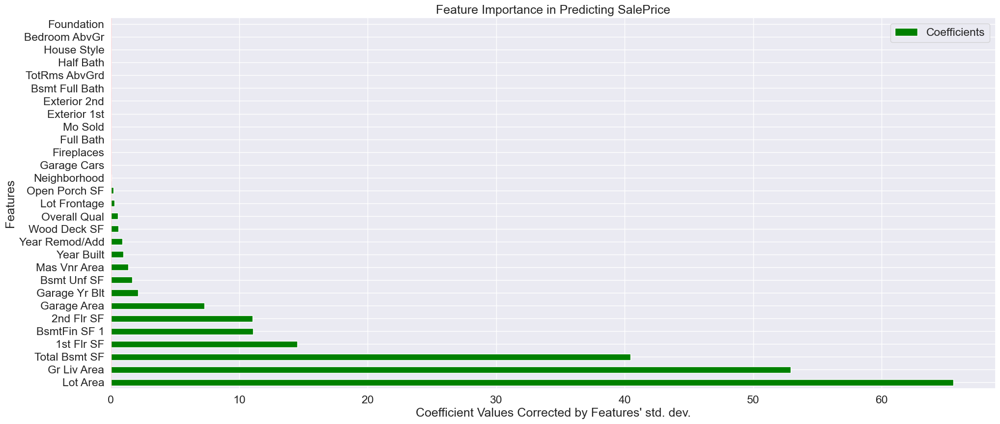

In [43]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model7, res7, features7, pred7 = build_op_xgb(X_train, y_train, X_test, best_params=None) # Call Method to 'Build XGB Without Optimal Hypertuned Parameters'

#Collect & Append Results
r7 = np.array2string(res7)####
r7 = pd.DataFrame([r7.split(';') for x in r7.split('\n')])
r7 = r7.rename(columns={0: 'SCORE'}) 
r7['MODEL'] = 'XGB'
r7['MODEL#'] = 'Model 7'
r7

<div class="alert alert-block alert-info">
<H4>
Model 8: XGB With `Optimal Hypertuned Parameters`
</H4></div>

Model Directory: 
['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_is_fitted__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_can_inverse_transform', '_can_transform', '_check_feature_names', '_check_fit_params', '_check_n_features', '_estimator_type', '_final_estimator', '_fit', '_get_param_names', '_get_params', '_get_tags', '_iter', '_log_message', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_required_parameters', '_set_params', '_sk_visual_block_', '_validate_data', '_validate_names', '_validate_steps', 'classes_', 'decision_function', 'feature_names_in_', 'fit', 

,SCORE,MODEL,MODEL#
0,-9.97035565e+08,XGB Optimal,Model 8


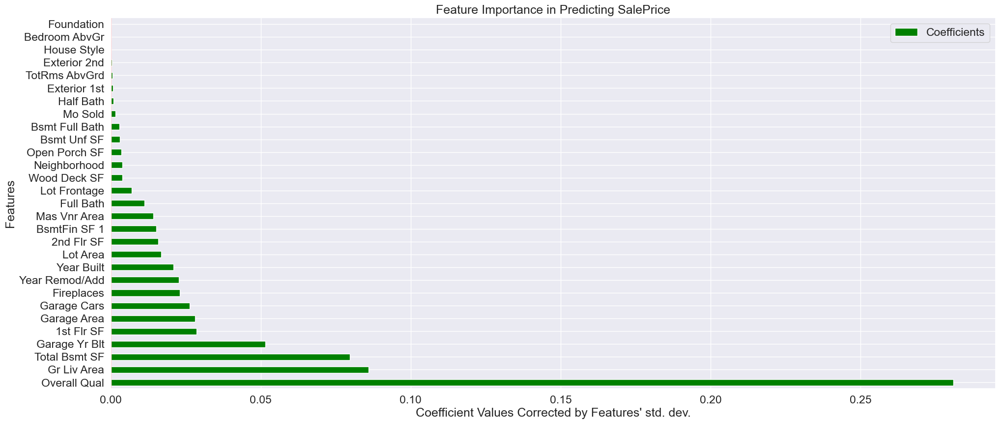

In [44]:
#Running the Model...Call Method to 'Build LR Without Adjusted Class Weights'
model8, res8, features8, pred8 = build_op_xgb(X_train, y_train, X_test, best_params=optimal_params_xgb) # Call Method to 'Build XGB With Optimal Hypertuned Parameters'

#Collect & Append Results
r8 = np.array2string(res8)####
r8 = pd.DataFrame([r8.split(';') for x in r8.split('\n')])
r8 = r8.rename(columns={0: 'SCORE'}) 
r8['MODEL'] = 'XGB Optimal'
r8['MODEL#'] = 'Model 8'
r8

<div class="alert alert-block alert-success">
<H4>
Summary Results
</H4></div>
<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 1. Compile Results </span>
</H4></div>

In [45]:
# Create Empty Dataframe to Capture Results
dummy_data = []
results = pd.DataFrame(dummy_data, columns=['SCORE'])
###################################################################
# Append Results to Empty Dataframe
results=results.append([r1]) 
results=results.append([r2]) 
results=results.append([r3]) 
results=results.append([r4]) 
results=results.append([r5]) 
results=results.append([r6]) 
results=results.append([r7]) 
results=results.append([r8]) 
results = results.sort_values(by=['SCORE'], ascending=True)
#results = results.astype({'SCORE':'float'})
results['SCORE'] = results['SCORE'].astype(float)

from math import log10, floor
import math

#results["SCORE"] = round(results["SCORE"], -2)
#results = results.round({'SCORE': 1})


print(colored("Recommended Model:", 'magenta', attrs=['bold'])
      + colored("\n\nResult Summary is given below:\n", 'blue', attrs=['bold'])
      + colored(results, 'red', attrs=['bold'])
      
      + colored("\n\nRecommended Model and Justification:", 'blue', attrs=['bold'])
      + colored("\n\nModel Scoring has been carried out using mean squared error (MSE). \n" , 'green', attrs=['bold'])
      + colored( "MSE shows closeness of a regression line to a set of points and helps in finding average of a set of errors. \n" , 'green', attrs=['bold'])
      + colored( "It takes the distances (or errors) from the points to the regression line and squares them to remove any negative signs. \n" , 'green', attrs=['bold'])
      + colored( "Since it lends more weight to larger differences, hence, the lower the MSE, the better the forecast. \n" , 'green', attrs=['bold'])
      + colored("In other words, the smaller the MSE, the closer the model is to the line of best fit.\n", 'green', attrs=['bold'])
      + colored("A Score of Zero would mean the model is perfect.\n ", 'green', attrs=['bold'])
      
      + colored("\nTherefore, when scoring a regression model with MSE, a minimal score would imply a better prediction\n", 'green', attrs=['bold'])
      + colored("Hence, we will select the model with Minimal Score. ", 'green', attrs=['bold'])
      + colored("\n\nIn this case, the Model ", 'green', attrs=['bold'])
      + colored(results.iloc[0,1], 'blue', attrs=['bold'])
      + colored(" is yielding Minimal Score of ", 'green', attrs=['bold'])      
      + colored(results.iloc[0,0], 'red', attrs=['bold'])
      +colored(".\n\nHence, we will select this model for Ames, Iowa House Price Prediction.", 'magenta', attrs=['bold'])
     )

Recommended Model:

Result Summary is given below:
          SCORE                MODEL   MODEL#
0 -1.303370e+09        Lasso Optimal  Model 4
0 -1.303938e+09   Regression Optimal  Model 2
0 -1.307846e+09           Regression  Model 1
0 -1.307846e+09                Lasso  Model 3
0 -1.321262e+09  Elastic-Net Optimal  Model 6
0 -1.326805e+09          Elastic-Net  Model 5
0 -9.909903e+08                  XGB  Model 7
0 -9.970356e+08          XGB Optimal  Model 8

Recommended Model and Justification:

Model Scoring has been carried out using mean squared error (MSE). 
MSE shows closeness of a regression line to a set of points and helps in finding average of a set of errors. 
It takes the distances (or errors) from the points to the regression line and squares them to remove any negative signs. 
Since it lends more weight to larger differences, hence, the lower the MSE, the better the forecast. 
In other words, the smaller the MSE, the closer the model is to the line of best fit.
A Score 

<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 2. Visualize Model Evaluation Summary as Bar Chart </span>
</H4></div>

                    Chart Values
           SCORE                MODEL   MODEL#
0 -1.303370e+09        Lasso Optimal  Model 4
0 -1.303938e+09   Regression Optimal  Model 2
0 -1.307846e+09           Regression  Model 1
0 -1.307846e+09                Lasso  Model 3
0 -1.321262e+09  Elastic-Net Optimal  Model 6
0 -1.326805e+09          Elastic-Net  Model 5
0 -9.909903e+08                  XGB  Model 7
0 -9.970356e+08          XGB Optimal  Model 8

                       Model Evaluation Summary as Bar Chart


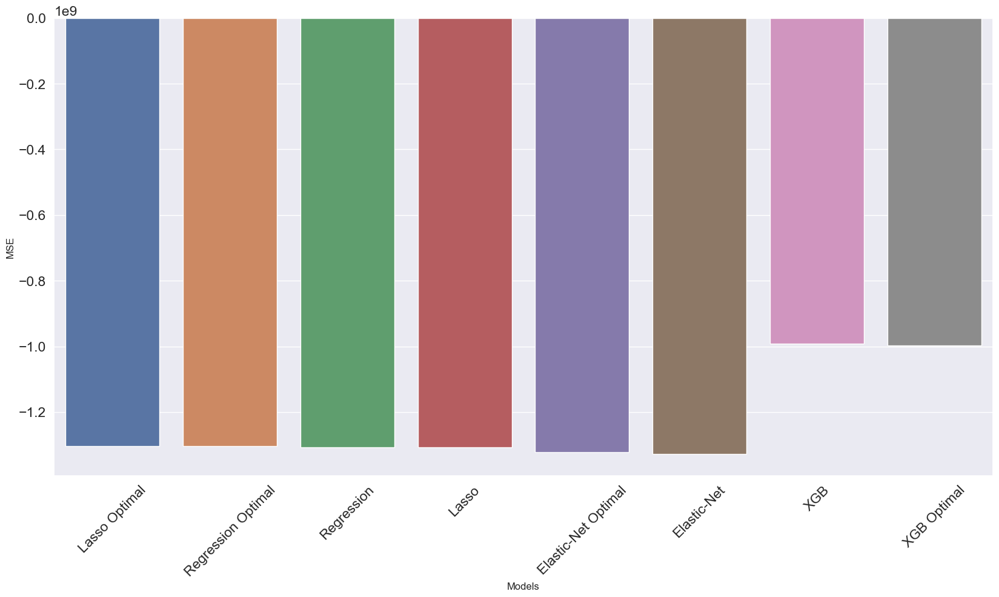

In [46]:
print(colored("                    Chart Values\n ", 'blue', attrs=['bold'])
      + colored(results.iloc[0:, 0:6], 'magenta', attrs=['bold'])
      +colored("\n\n                       Model Evaluation Summary as Bar Chart", 'green', attrs=['bold'])
     )

plt.figure(figsize = (20,10))
sns.barplot(results['MODEL'],results['SCORE'])
plt.xlabel('Models', fontsize = 12)
plt.ylabel('MSE', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 3. Capture Feature Importance </span>
</H4></div>

Contributory Features driving Sales Price:

Features Summary with Coefficient Values is given below:

          Features  Coefficients
0      Gr Liv Area         12471
1    Total Bsmt SF         12391
2     Overall Qual          8656
3   Year Remod/Add          8204
4       Fireplaces          7011
5       Year Built          5441
6       2nd Flr SF          4637
7         Lot Area          4052
8       Foundation          3413
9      Garage Area          3170
10    Mas Vnr Area          2474
11   Garage Yr Blt          2374
12       Full Bath          1830
13  Bsmt Full Bath          1448
14    BsmtFin SF 1          1302
15    Exterior 2nd           656
16   Open Porch SF           132
17    Wood Deck SF            67
39       Half Bath          -207
40    Exterior 1st          -301
41     Garage Cars          -435
42    Neighborhood          -574
43   Bedroom AbvGr         -1988
44    Lot Frontage         -2978


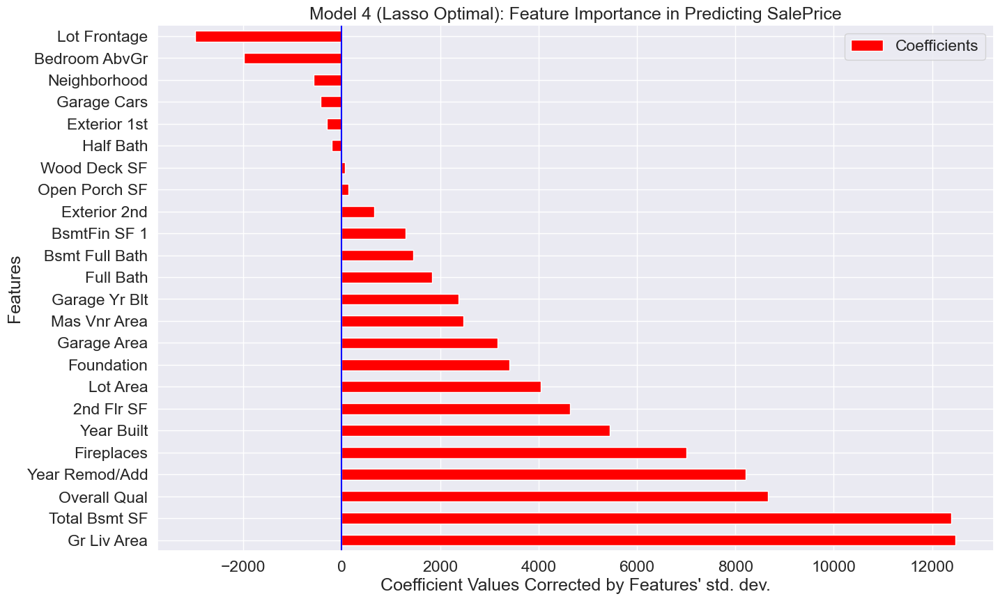

In [47]:
model_name = results['MODEL'].iloc[0] # Get Model Name    
model = results['MODEL#'].iloc[0] # Get Model Number
#model = 'model8' # Uncomment to Check Other Models

#def feature_importance():
if model == 'Model 1':#
    features  = features1.copy()
elif model == 'Model 2':
    features  = features2.copy()
elif model == 'Model 3':
    features  = features3.copy()
elif model == 'Model 4':
    features  = features4.copy()
elif model == 'Model 5':#
    features  = features5.copy()
elif model == 'Model 6':
    features  = features6.copy()
elif model == 'Model 7':
    features  = features7.copy()
elif model == 'Model 8':
    features  = features8.copy()
else:
    print("")

# Get Final Features     
features['Coefficients'] = features['Coefficients'].astype(int)
features = features.loc[(features['Coefficients'] > 0)|(features['Coefficients'] < 0)] # Remove Features with Zero Coefficient

cols = ['Features', 'Coefficients']
features = features[cols]

print(colored("Contributory Features driving Sales Price:", 'magenta', attrs=['bold'])
      + colored("\n\nFeatures Summary with Coefficient Values is given below:\n\n", 'blue', attrs=['bold'])
      + colored(features, 'red', attrs=['bold'])
     )

# Make Features Plot
data = features.copy()
data.set_index('Features', inplace=True)
data.plot.barh(figsize=(20,10), color='red')

title = model + " (" + model_name +"): Feature Importance in Predicting " + target
plt.title(title)
plt.axvline(x=0, color="blue")
plt.xlabel("Coefficient Values Corrected by Features' std. dev.")
plt.subplots_adjust(left=0.3)

plt.savefig(save_plot)


<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 4. Rank Ames Homes Data by Feature Importance </span>
</H4></div>

In [48]:
# Get List of top Features
top = features.head(15)
top = list(top['Features'])

# Get Columns representing Contributory Features
final_list = list(features['Features'])
rank = df_encoded.loc[:, df_encoded.columns.isin(final_list)]
rank = rank[final_list] # 

# Sort Columns by 'top'features List
rank = rank.sort_values(top, ascending = [False, False,False,False,False,False,False,False,False,False,False,False,False,False,False])
rank = rank.reset_index(drop=True) # Reset Index
rank.head(10)
#cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100 
#frame.apply(cv)

,Gr Liv Area,Total Bsmt SF,Overall Qual,Year Remod/Add,Fireplaces,Year Built,2nd Flr SF,Lot Area,Foundation,Garage Area,...,BsmtFin SF 1,Exterior 2nd,Open Porch SF,Wood Deck SF,Half Bath,Exterior 1st,Garage Cars,Neighborhood,Bedroom AbvGr,Lot Frontage
0,2656,1934.0,9,2007,1,2007,713,13641,2,0.0,...,1304.0,5,58,268,1,5,3.0,19,3,107.0
1,2654,1054.0,6,1984,1,1968,1142,11029,1,619.0,...,619.0,6,65,0,1,6,2.0,17,4,0.0
2,2654,671.0,5,1996,1,1920,1087,16779,1,638.0,...,267.0,15,0,128,0,14,2.0,22,4,99.0
3,2650,0.0,4,1967,0,1967,0,7200,3,0.0,...,0.0,4,0,0,0,9,0.0,21,3,60.0
4,2649,1479.0,8,2002,1,2001,1134,16900,2,746.0,...,1075.0,14,60,0,1,13,3.0,19,4,130.0
5,2646,1748.0,7,1974,0,1974,495,14330,1,550.0,...,1023.0,15,100,0,0,15,2.0,27,3,100.0
6,2646,1347.0,7,1993,1,1993,1274,9900,2,656.0,...,987.0,6,60,340,1,6,3.0,18,4,90.0
7,2643,0.0,9,2006,1,2006,574,13693,2,694.0,...,0.0,14,84,414,1,13,3.0,19,3,105.0
8,2640,2036.0,9,2006,1,2006,604,13162,2,792.0,...,0.0,14,0,0,1,13,3.0,24,3,100.0
9,2640,1240.0,7,2003,1,2005,1320,11700,2,864.0,...,0.0,13,0,181,1,12,2.0,20,4,65.0


<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 5. Predict Sale Price on Ames Homes' Original Test Data </span>
</H4></div>

In [49]:
# Get Target Variable Predictions
if model == 'Model 1':#
    prediction  = pred1.copy()
elif model == 'Model 2':
    prediction  = pred2.copy()
elif model == 'Model 3':
    prediction  = pred3.copy()
elif model == 'Model 4':
    prediction  = pred4.copy()
elif model == 'Model 5':#
    prediction  = pred5.copy()
elif model == 'Model 6':
    prediction  = pred6.copy()
elif model == 'Model 7':
    prediction  = pred7.copy()
elif model == 'Model 8':
    prediction  = pred8.copy()
else:
    print("")

# Attach Predictions to Test Data
test_data = raw_data.copy()
#cols = ['Id']+test_data.columns.tolist()+['Predicted Price'] # Uncomment if all original columns are desired
cols = ['Id'] + final_list + [target] + [predicted_var] # Comment if previous line has been Uncommented
test_data['Id'] = test_data.index 
test_data = test_data.merge(prediction, on='Id', how='left').sort_values(by=['Id'], ascending=True).fillna(0)
test_data = test_data[test_data[predicted_var] != 0]
test_data = test_data[cols]
test_data[predicted_var] = test_data[predicted_var].astype(int)
test_data['Price Difference'] = test_data[predicted_var] - test_data[target]
test_data

,Id,Gr Liv Area,Total Bsmt SF,Overall Qual,Year Remod/Add,Fireplaces,Year Built,2nd Flr SF,Lot Area,Foundation,...,Wood Deck SF,Half Bath,Exterior 1st,Garage Cars,Neighborhood,Bedroom AbvGr,Lot Frontage,SalePrice,Predicted Price,Price Difference
0,0,1656,1080.0,6,1960,2,1960,0,31770,CBlock,...,210,0,BrkFace,2.0,NAmes,3,141.0,215000,182487,-32513
4,4,1629,928.0,5,1998,1,1997,701,13830,PConc,...,212,1,VinylSd,2.0,Gilbert,3,74.0,189900,190146,246
6,6,1338,1338.0,8,2001,0,2001,0,4920,PConc,...,0,0,CemntBd,2.0,StoneBr,2,41.0,213500,192633,-20867
9,9,1804,994.0,7,1999,1,1999,776,7500,PConc,...,140,1,VinylSd,2.0,Gilbert,3,60.0,189000,201465,12465
15,15,3279,1650.0,8,2003,1,2003,1589,53504,PConc,...,503,1,CemntBd,3.0,StoneBr,4,47.0,538000,229080,-308920
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2919,2919,1092,546.0,4,1970,0,1970,546,1936,CBlock,...,0,1,CemntBd,0.0,MeadowV,3,21.0,90500,89237,-1263
2920,2920,1092,546.0,4,1970,0,1970,546,1894,CBlock,...,0,1,CemntBd,1.0,MeadowV,3,21.0,71000,104558,33558
2924,2924,1224,1224.0,5,1996,1,1960,0,20000,CBlock,...,474,0,VinylSd,2.0,Mitchel,4,160.0,131000,168063,37063
2926,2926,902,864.0,5,1983,0,1983,0,8885,CBlock,...,164,0,HdBoard,2.0,Mitchel,2,0.0,131000,135926,4926


<div class="alert alert-block alert-warning">
<H4>
<span style='color:Indigo'> 6. Prepare Output Report </span>
</H4></div>

In [50]:
import openpyxl
from openpyxl import Workbook
from openpyxl import load_workbook
import openpyxl as px
from openpyxl.utils import get_column_letter
from openpyxl.styles import Color, PatternFill, Font, Border, Side  
from openpyxl.drawing.image import Image
import time
import os

#Create Border....from openpyxl.styles import Color, PatternFill, Font, Border, Side
border = Border(left=Side(border_style='thin', color='000000'),
            right=Side(border_style='thin', color='000000'),
            top=Side(border_style='thin', color='000000'),
            bottom=Side(border_style='thin', color='000000'))

#Create Font Color Map
red=Font(name='Calibri', size='9', color= 'FF0134',bold=False)
pink=Font(name='Calibri', size='9', color= '6E096E',bold=False)
blue=Font(name='Calibri', size='9', color= '250C76',bold=False)
green=Font(name='Calibri', size='9', color= '08500A',bold=False)
black=Font(name='Calibri', size='9', color= '000000',bold=False)
yellow=Font(name='Calibri', size='9', color= 'F8FF06',bold=False)
yellowbold=Font(name='Calibri', size='9', color= 'F8FF06',bold=True)

## WRITE SHEET "ws1"
# write data to excel
print('Now Writing Data to Excel')
wb = openpyxl.Workbook()
wb.save(output_file_path) # This line Create new workbook if not reusing a previous one...omit if re-writing existing wb and want to preserve sheets
wb = load_workbook(output_file_path)
ws = wb.active
keep_sheets = ['Instructions']
for sheetName in wb.sheetnames:
    if sheetName not in keep_sheets:
        del wb[sheetName]
        time.sleep(2)  

writer = pd.ExcelWriter(output_file_path,engine='openpyxl')
writer.book = wb

## WRITE SHEET "ws1"
# Write 'rank' dataframe to Excel
sheet1 = 'FINAL DATA'
print("Transferring 'rank' dataframe to Excel Sheet 1")
rank.to_excel(writer, sheet1 ,index = False)
ws1 = wb[sheet1]
ws1.sheet_properties.tabColor = "FF4500"

#Auto-filter Columns
print('Putting Filters on Column Headers')
ws1.auto_filter.ref = ws1.dimensions

#Autofit Columns
print('Autofit Columns')
for column in ws1.columns: # from openpyxl.utils import get_column_letter
    length = max(len(str(cell.value)) for cell in column)
    length = length if length <= 60 else 60
    ws1.column_dimensions[column[0].column_letter].width = length

#Determine Max Rows & Columns for Excel Sheet Coloring
ws1maxRow = ws1.max_row
ws1maxCol = ws1.max_column

#COLOR ws1 BY COLUMN RANGE:
#for colNum in range([start@, till max columns, skip & start again @):
for colNum in range(1, ws1maxCol + 1):
    for rowNum in range(1, ws1maxRow + 1):
        ws1.cell(row=rowNum, column=colNum).fill = PatternFill(fgColor='C8EFF2', fill_type = 'solid')
        ws1.cell(row=rowNum, column=colNum).border = border
        ws1.cell(row=rowNum, column=colNum).font = black

print('Making Header')
#Format Header:
font=Font(name='Calibri', size='12', color= 'FFF809',bold='bold')
for col in range(1, ws1maxCol + 1):
    cell_header = ws1.cell(1, col)
    cell_header.font = yellowbold
    cell_header.fill = PatternFill(start_color='0B0B0B', end_color='0B0B0B', fill_type="solid") #used hex code for red color

## WRITE SHEET "ws2"
# Write 'features' dataframe to Excel
sheet2 = 'CONTRIBUTORY FACTORS'
print("Transferring 'features' dataframe to Excel Sheet 2")
features.to_excel(writer, sheet2 ,index = False)
ws2 = wb[sheet2]
ws2.sheet_properties.tabColor = "0F16EF"

#Auto-filter Columns
print('Putting Filters on Column Headers')
ws2.auto_filter.ref = ws2.dimensions

#Autofit Columns
print('Autofit Columns')
for column in ws2.columns: # from openpyxl.utils import get_column_letter
    length = max(len(str(cell.value)) for cell in column)
    length = length if length <= 60 else 60
    ws2.column_dimensions[column[0].column_letter].width = length

#Determine Max Rows & Columns for Excel Sheet Coloring
ws2maxRow = ws2.max_row
ws2maxCol = ws2.max_column

#COLOR ws2 BY COLUMN RANGE:
#for colNum in range([start@, till max columns, skip & start again @):
for colNum in range(1, ws2maxCol + 1):
    for rowNum in range(1, ws2maxRow + 1):
        ws2.cell(row=rowNum, column=colNum).fill = PatternFill(fgColor='D5FFE9', fill_type = 'solid')
        ws2.cell(row=rowNum, column=colNum).border = border
        ws2.cell(row=rowNum, column=colNum).font = black
for colNum in range(2, ws2maxCol + 1, 1):
    for rowNum in range(2, ws2maxRow + 1):
        ws2.cell(row=rowNum, column=colNum).fill = PatternFill(fgColor='FAE4FA', fill_type = 'solid')
        ws2.cell(row=rowNum, column=colNum).border = border
        ws2.cell(row=rowNum, column=colNum).font = pink

print('Making Header')
#Format Header:
font=Font(name='Calibri', size='12', color= 'FFF809',bold='bold')
for col in range(1, ws2maxCol + 1):
    cell_header = ws2.cell(1, col)
    cell_header.font = yellowbold
    cell_header.fill = PatternFill(start_color='0B0B0B', end_color='0B0B0B', fill_type="solid") #used hex code for red color

# Insert Figure
#from openpyxl.drawing.image import Image as XLImage
#from PIL import Image as PILImage
from PIL import Image, ExifTags
IMAGE = Image.open(save_plot)
img = openpyxl.drawing.image.Image(IMAGE)
img.height = 500  # insert image height in pixels as float or int (e.g. 305.5)
img.width= 800 # insert image width in pixels as float or int (e.g. 405.8)
img.anchor = 'C1' # where you want image to be anchored/start from
ws2.add_image(img) # adding in the image
print('image written')

## WRITE SHEET "ws3"
# Write 'test_data' dataframe to Excel
sheet3 = 'TEST PREDICTED SALES'
print("Transferring 'test_data' to Excel Sheet 3")
test_data.to_excel(writer, sheet3 ,index = False)
ws3 = wb[sheet3]
ws3.sheet_properties.tabColor = "B0D41F"

#Auto-filter Columns
print('Putting Filters on Column Headers')
ws3.auto_filter.ref = ws3.dimensions

#Autofit Columns
print('Autofit Columns')
for column in ws3.columns: # from openpyxl.utils import get_column_letter
    length = max(len(str(cell.value)) for cell in column)
    length = length if length <= 60 else 60
    ws3.column_dimensions[column[0].column_letter].width = length

#Determine Max Rows & Columns for Excel Sheet Coloring
ws3maxRow = ws3.max_row
ws3maxCol = ws3.max_column

#COLOR ws1 BY COLUMN RANGE:
#for colNum in range([start@, till max columns, skip & start again @):
for colNum in range(1, ws3maxCol + 1):
    for rowNum in range(1, ws3maxRow + 1):
        ws3.cell(row=rowNum, column=colNum).fill = PatternFill(fgColor='F7FFD5', fill_type = 'solid')
        ws3.cell(row=rowNum, column=colNum).border = border
        ws3.cell(row=rowNum, column=colNum).font = black

print('Making Header')
#Format Header:
font=Font(name='Calibri', size='12', color= 'FFF809',bold='bold')
for col in range(1, ws3maxCol + 1):
    cell_header = ws3.cell(1, col)
    cell_header.font = yellowbold
    cell_header.fill = PatternFill(start_color='0B0B0B', end_color='0B0B0B', fill_type="solid") #used hex code for red color

#Write & Save
print('Writing and Saving')
wb.save(output_file_path)
writer.save()
print('File Saved')

#OPEN FILE
print('Opening File')
os.startfile(output_file_path)
print('File is now open for viewing')

Now Writing Data to Excel
Transferring 'rank' dataframe to Excel Sheet 1
Putting Filters on Column Headers
Autofit Columns
Making Header
Transferring 'features' dataframe to Excel Sheet 2
Putting Filters on Column Headers
Autofit Columns
Making Header
image written
Transferring 'test_data' to Excel Sheet 3
Putting Filters on Column Headers
Autofit Columns
Making Header
Writing and Saving
File Saved
Opening File
File is now open for viewing


<div class="alert alert-block alert-danger">
<H4>
Get Script End Time
</H4></div>

In [51]:
#Print Total Execution Time
print('Script Took ', datetime.now() - script_start_time, ' Minutes.')

Script Took  0:15:30.663476  Minutes.


<div class="alert alert-block alert-success">
<H4>
BIBLIOGRAPHY
</H4></div>

**LINKS TO OTHER USEFUL MODELS <br>
https://www.kaggle.com/code/mgmarques/houses-prices-complete-solution <br>
https://www.kaggle.com/code/marto24/beginners-prediction-top3 <br>
https://www.kaggle.com/code/mchatham/ames-housing-regression <br>
https://www.kaggle.com/code/mkariithi/real-estate-sales-price-prediction/notebook <br>
https://www.kaggle.com/code/bashkeel/eda-to-ensemble-model-lasso-ridge-xgboost <br>
https://www.kaggle.com/code/gerlandore/advanced-house-regression-eda-model-comparison <br>
https://www.kaggle.com/code/prasadperera/the-boston-housing-dataset/notebook <br>
https://www.kaggle.com/search?q=ADVANCED+LINEAR+REGRESSION+BOSTON+HOUSE+PREDICTION <br>
https://www.kaggle.com/code/koki25ando/nba-salary-prediction-using-multiple-regression**

**OTHER USEFUL LINKS** <br>
**Managing Outliers: <br>
https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-a-pandas-dataframe <br>
https://stackoverflow.com/questions/68348516/automating-removing-outliers-from-a-pandas-dataframe-using-iqr-as-the-parameter <br>
https://medium.com/analytics-vidhya/identifying-cleaning-and-replacing-outliers-titanic-dataset-20182a062893 <br>
https://www.linkedin.com/pulse/machine-learning-all-you-need-know-outliers-gaurav-pahuja**

**REMOVE MULTIPLE COLLINEARITY <br>
https://www.yourdatateacher.com/2021/06/28/a-python-library-to-remove-collinearity/ <br>
https://quantifyinghealth.com/vif-threshold/#:~:text=Most%20research%20papers%20consider%20a,of%205%20or%20even%202.5.**<br>

**SCIKIT: TYPES OF LINEAR REGRESSION MODELS <br>
https://scikit-learn.org/stable/modules/linear_model.html#**

**FIND MODEL HYPERPARAMETERS <br>
Optimal Hyper-parameter Search Methods: <br>
https://machinelearningmastery.com/hyperparameter-optimization-with-random-search-and-grid-search/**

**HYPERPARAMETERS FOR DIFFERENT MODELS <br>
https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html <br>
https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html <br>
https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html <br>
https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html <br>**

**EVALUATING & UNDERSTANDING RESULTS <br>
https://stackoverflow.com/questions/48244219/is-sklearn-metrics-mean-squared-error-the-larger-the-better-negated <br>
https://www.projectpro.io/recipes/use-regression-metrics-in-python <br>
https://scikit-learn.org/stable/auto_examples/inspection/plot_linear_model_coefficient_interpretation.html**